# STOFS Event-based Skill Assessment 
Here we are reading, subsetting and visualizing the forecast and nowcast data from STOFS-2D-Global and STOFS-3D-Atl data. We also read and plot reported water levels at CO-OPS stations. 

In [1]:
import dask
import geoviews as gv
import holoviews as hv
import numcodecs
import numpy as np
import pandas as pd
import geopandas as gpd
from cartopy.feature import NaturalEarthFeature
from matplotlib import pyplot

import shapely
import xarray as xr
import matplotlib.pyplot as plt
import s3fs  # Importing the s3fs library for accessing S3 buckets
import time  # Importing the time library for recording execution time
import shapely  # Importing shapely for geometric operations 
import thalassa  # Importing thalassa library for STOFS data analysis
from thalassa import api  # Importing thalassa API for data handling
from thalassa import normalization
from thalassa import utils
from holoviews import opts as hvopts
from holoviews import streams
from holoviews.streams import PointerXY
from holoviews.streams import Tap
import bokeh.plotting as bp
from datetime import datetime, timedelta, timezone
import searvey
from searvey.coops import get_coops_stations
from searvey._coops_api import fetch_coops_station
import tempfile
import pygrib
import math
from typing import List
from stormevents.nhc import nhc_storms, VortexTrack
from stormevents import StormEvent

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Input Parameters for Event Analysis


- **bucket_name_2d**: Name of the S3 bucket storing STOFS-2d-global data.
- **bucket_name_3d**: Name of the S3 bucket storing STOFS-3d-Atl data.
- **date_range**: Date range in YYYYMMDD format for analysis.
- **cycles_2d**: List of cycle times (in HH format, e.g., 00, 06, 12, 18) for STOFS-2d-Global forecasts.
- **Hours_before_landfall**: Number of hours before landfall for analysis.
- **Region**: Bounding box string defining the region of interest (min_lon, max_lon, min_lat, max_lat).
- **Event_name**: Name of the storm for hurricane track data extraction and file naming.
- **STOFS_file_2d**: File from STOFS-2d-Global for water level skill assessment.
- **STOFS_file_3d**: File from STOFS-3d-Atl for water level skill assessment.




In [2]:
# Info of STOFS data

bucket_name_2d   = 'noaa-gestofs-pds'
bucket_name_3d  = 'noaa-nos-stofs3d-pds'
date_range         = ['20240910','20240712']  
landfall_time_step = 75 # hours after start date from the date range input
cycles_2d        = ['00', '06', '12', '18']  
Hours_before_landfall = 24 # For reading Forecast data
Region       = 'NaN'  # select 'NaN' if you want to use region based on storm track or use (longitude_min, longitude_max, latitude_min, latitude_max) e.g. (-96, -94, 28, 30) 
Event_name = 'Hurricane Helene'
storm_name = 'helene'
storm_year = 2024
advisory = 'BEST' #'OFCL' for latest forecast and change it to 'BEST' if best track is available 
STOFS_file_2d   = 'points.cwl'
STOFS_file_3d   = 'points.cwl'
STOFS_file_2d_noanomaly = 'points.cwl.noanomaly'



## Hurricane Track Visualization: Optional, Skip if Storm Track Data is Not Needed


In [3]:
# Load storm and obtain isobars from stormevent  
storm = StormEvent(storm_name, storm_year)

#By default, retrieves data from the BEST track file deck (b). You can specify that you want the ADVISORY (a) or FIXED (f) file decks with the file_deck parameter.
#storm_track = storm.track() #storm.track(file_deck='a')
if advisory=='BEST':
    storm_track = storm.track()
else:    
    storm_track = storm.track(file_deck='a')
#storm_track.data[storm_track.data['advisory']=='BEST']

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/stormevents/nhc/track.py:1137: RuntimeWarning: invalid value encountered in divide
  speeds = pandas.Series(distances / abs(intervals), index=indices)
/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/stormevents/nhc/track.py:1137: RuntimeWarning: invalid value encountered in divide
  speeds = pandas.Series(distances / abs(intervals), index=indices)


In [4]:
def get_storm_track_date(storm_track, advisory):
    if advisory == 'BEST':

      for idx in storm_track.linestrings[advisory]:
          track_date = idx
    else:
      for idx in storm_track.wind_swaths(wind_speed=64)[advisory]:
        track_date = idx
    return track_date

In [5]:
# get start and end date of storm
#track_date = get_storm_track_date(storm_best_track, 'BEST')
track_date = get_storm_track_date(storm_track, advisory)
storm_start_date = storm_track.start_date.strftime('%Y%m%d')
storm_end_date = storm_track.end_date.strftime('%Y%m%d') 
date_range = (storm_start_date, storm_end_date)
date_range

('20240924', '20240928')

In [6]:
gdf_countries = gpd.GeoSeries(NaturalEarthFeature(category='physical', scale='10m', name='land').geometries(), crs=4326)
gdf_countries

0     MULTIPOLYGON (((-0.00029 -71.49903, 0.01555 -7...
1     MULTIPOLYGON (((166.13697 -50.86435, 166.20525...
2     MULTIPOLYGON (((-78.78897 -33.60906, -78.78038...
3     MULTIPOLYGON (((163.98512 -20.04762, 163.98609...
4     MULTIPOLYGON (((134.70737 -6.58904, 134.72006 ...
5     MULTIPOLYGON (((-80.05989 -2.66277, -80.01452 ...
6     MULTIPOLYGON (((81.87599 7.09195, 81.87843 7.0...
7     MULTIPOLYGON (((55.01800 24.97651, 55.01580 24...
8     MULTIPOLYGON (((134.68979 33.82807, 134.72203 ...
9     MULTIPOLYGON (((14.76303 68.49486, 14.71746 68...
10    POLYGON ((-0.00479 -0.00439, -0.00479 0.00482,...
dtype: geometry

In [7]:
geometries = list(NaturalEarthFeature(category='physical', scale='50m', name='land').geometries())
land_gdf = gpd.GeoDataFrame(geometry=geometries, crs='EPSG:4326')
land_gdf

,geometry
0,"POLYGON ((179.99922 -16.16855, 179.84824 -16.3..."
1,"POLYGON ((177.23418 -17.14707, 177.18281 -17.1..."
2,"POLYGON ((127.37266 0.79131, 127.33838 0.75845..."
3,"POLYGON ((-81.33481 24.65049, -81.36479 24.629..."
4,"POLYGON ((-80.82939 24.80366, -80.84834 24.803..."
...,...
1415,"POLYGON ((-166.10986 66.22744, -166.14863 66.2..."
1416,"POLYGON ((-86.71401 21.23931, -86.69629 21.191..."
1417,"POLYGON ((54.46543 24.44277, 54.45664 24.42334..."
1418,"POLYGON ((-81.78384 24.54458, -81.80923 24.542..."


In [8]:
#gpd.sjoin(storm_track.data[storm_track.data['advisory']=='BEST'], land_gdf, how='inner')


In [9]:
def plot_isobar_domains(storm_track, track_date, gdf_countries):
    figure, axis = plt.subplots(1, 1)
    figure.set_size_inches(12, 12 / 1.618)
    
    # track_date = get_storm_track_date(storm_track, 'BEST')

    axis.plot(*storm_track.wind_swaths(wind_speed=34)[advisory][track_date].exterior.xy, 
              c='limegreen', label='34 kt')
    axis.plot(*storm_track.wind_swaths(wind_speed=50)[advisory][track_date].exterior.xy, 
              c='blue', label='50 kt')
    axis.plot(*storm_track.wind_swaths(wind_speed=64)[advisory][track_date].exterior.xy, 
              c='red', label='64 kt')
    axis.plot(*storm_track.linestrings[advisory][track_date].xy, 
              c='black',label='track')
    
    xlim = axis.get_xlim()
    ylim = axis.get_ylim()
    
    gdf_countries.plot(color='lightgrey', ax=axis, zorder=-1)
    
    axis.set_xlim(xlim)
    axis.set_ylim(ylim)
    axis.legend()
    axis.set_title(f'{storm_track.name}_{storm_track.year}  track windswatch')
    figure.savefig(f'{storm_track.name}_{storm_track.year}_track_windswatch.png')

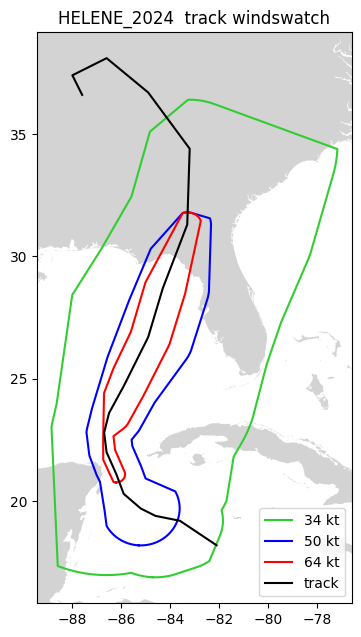

In [10]:
plot_isobar_domains(storm_track, track_date, gdf_countries)


# Read STOFS-2d-Global Nowcast Data on the Fly

In [11]:
#STOFS.py functions
def read_STOFS_from_s3(bucket_name, key):
    """
    Function to read a STOFS station files from an S3 bucket.
    
    Parameters:
    - bucket_name: Name of the S3 bucket
    - key: Key/path to the NetCDF file in the bucket
    
    Returns:
    - ds: xarray Dataset containing the NetCDF data
    """
    s3 = s3fs.S3FileSystem(anon=True)
    url = f"s3://{bucket_name}/{key}"
    ds = xr.open_dataset(s3.open(url, 'rb'))
    return ds


def get_station_nowcast_data(filename, modelname, directoryname, bucketname, daterange, steps, cycles):
    """
    Function to read STOFS Nowcast data from a station file on an S3 bucket.
    
    Parameters:
    - filename (str): The base filename for STOFS data
    - modelname (str): The STOFS model name 
    - directoryname (str): Optional directory name in the S3 bucket
    - bucketname (str): The name of the S3 bucket
    - daterange (list of two str): Start and end dates in 'YYYYMMDD' format
    - steps (int): Number of steps to slice as the nowcast period in each STOFS file
    - cycles (list of str): List of cycles (e.g., ['00', '12'])
    
    Returns:
    - xarray.Dataset: Dataset containing the STOFS Nowcast data
    """

    # Parse the start and end dates from the date range
    start_date = datetime.strptime(daterange[0], '%Y%m%d')
    end_date = datetime.strptime(daterange[1], '%Y%m%d') + timedelta(days=1)  # Include the last day
    
    # Generate a list of dates in the specified range
    dates = []
    current_date = start_date
    while current_date <= end_date:
        dates.append(current_date.strftime('%Y%m%d'))  # Format as YYYYMMDD
        current_date += timedelta(days=1)

    nowcast_all_list = []
    
    for date in dates:
        for cycle in cycles:
            base_key = f'{modelname}.{date}'
            dataname = f't{cycle}z.{filename}.nc'
            if directoryname:
                key = f'{directoryname}/{base_key}/{modelname}.{dataname}'
            else:
                key = f'{base_key}/{modelname}.{dataname}'
                
            try:
                dataset = read_STOFS_from_s3(bucketname, key)

                # Check if dataset exists and has data
                if dataset is not None:
                    nowcast = dataset.isel(time=slice(0, steps))  # First 'steps' time steps (nowcast data)
                    nowcast_all_list.append(nowcast)
            except Exception as e:
                print(f'Error reading file {key} from S3: {str(e)}')

    # Concatenate all nowcast data and filter by date range
    nowcast_all_out_of_range = xr.concat(nowcast_all_list, dim='time')
    nowcast_all = nowcast_all_out_of_range.sel(time=slice(start_date, end_date))  # Filtered dataset

    return nowcast_all


def get_station_data(filename, modelname, directoryname, bucketname, date, cycle):
    """
    Function to read STOFS data for a particular date and cycle from a station file on an S3 bucket.
    
    Parameters:
    - filename (str): The base filename for STOFS data
    - modelname (str): The STOFS model name 
    - directoryname (str): Optional directory name in the S3 bucket
    - bucketname (str): The name of the S3 bucket
    - date (str): date in 'YYYYMMDD' format
    - cycle (str): cycle of the data (e.g.'12')
    
    Returns:
    - xarray.Dataset: Dataset containing the STOFS nowcast+forecast data from one cycle
    """
    

    base_key = f'{modelname}.{date}'
    dataname = f't{cycle}z.{filename}.nc'
    if directoryname:
       key = f'{directoryname}/{base_key}/{modelname}.{dataname}'
    else:
       key = f'{base_key}/{modelname}.{dataname}'
    try:
       dataset = read_STOFS_from_s3(bucketname, key)
    except Exception as e:
                print(f'Error reading file {key} from S3: {str(e)}')
    return dataset

In [12]:
# Read STOFS-2d-global
filename = 'points.cwl'
modelname = 'stofs_2d_glo'
directoryname = ''
bucketname = 'noaa-gestofs-pds'
steps = 60
cycles = ['00','06','12','18']

nowcast_2d_all = get_station_nowcast_data(filename, modelname, directoryname, bucketname,date_range, steps, cycles)

nowcast_2d_all

<xarray.Dataset> Size: 150MB
Dimensions:       (time: 1201, station: 1688)
Coordinates:
  * time          (time) datetime64[ns] 10kB 2024-09-24 ... 2024-09-29
Dimensions without coordinates: station
Data variables:
    station_name  (time, station) |S50 101MB b'PSBM1 SOUS41 8410140 ME Eastpo...
    x             (time, station) float64 16MB -66.98 -67.2 ... -51.01 -25.5
    y             (time, station) float64 16MB 44.9 44.65 44.39 ... 58.96 58.96
    zeta          (time, station) float64 16MB -1.081 -1.039 ... -0.4088 -0.3132
Attributes: (12/50)
    dry_Value:          -99999.0
    model:              ADCIRC
    version:            noaa.stofs.2d.glo.v2.1.0r1.v55.12
    git_hash:           23947fbd9683d0ef48f12e6ce62d45d18bc27ff3
    grid_type:          Triangular
    description:        2024092400 :-6 hr nowcast and +180 hr forecast ! 32 C...
    ...                 ...
    sfea0:              45.0
    cf:                 0.0005
    eslm:               -0.2
    cori:               0.0
    ntif:               8
    nbfr:               0

In [13]:
filename = 'points.cwl.noanomaly'
modelname = 'stofs_2d_glo'
directoryname = ''
bucketname = 'noaa-gestofs-pds'
steps = 60
cycles = ['00','06','12','18']

nowcast_2d_noanomaly_all = get_station_nowcast_data(filename, modelname, directoryname, bucketname,date_range, steps, cycles)
nowcast_2d_noanomaly_all

<xarray.Dataset> Size: 150MB
Dimensions:       (time: 1201, station: 1688)
Coordinates:
  * time          (time) datetime64[ns] 10kB 2024-09-24 ... 2024-09-29
Dimensions without coordinates: station
Data variables:
    station_name  (time, station) |S50 101MB b'PSBM1 SOUS41 8410140 ME Eastpo...
    x             (time, station) float64 16MB -66.98 -67.2 ... -51.01 -25.5
    y             (time, station) float64 16MB 44.9 44.65 44.39 ... 58.96 58.96
    zeta          (time, station) float64 16MB -1.771 -1.449 ... -0.4088 -0.3132
Attributes: (12/51)
    _FillValue:         -99999.0
    dry_Value:          -99999.0
    model:              ADCIRC
    version:            noaa.stofs.2d.glo.v2.1.0r1.v55.12
    git_hash:           23947fbd9683d0ef48f12e6ce62d45d18bc27ff3
    grid_type:          Triangular
    ...                 ...
    sfea0:              45.0
    cf:                 0.0005
    eslm:               -0.2
    cori:               0.0
    ntif:               8
    nbfr:               0

# Read STOFS-3d-Atlantic Nowcast Data on the Fly

In [14]:
# Read STOFS-3d-Atlantic

filename = 'points.cwl'
modelname = 'stofs_3d_atl'
directoryname = 'STOFS-3D-Atl'
bucketname = 'noaa-nos-stofs3d-pds'
steps = 240
cycles = ['12']

nowcast_3d_all = get_station_nowcast_data(filename, modelname, directoryname, bucketname,date_range, steps, cycles)
nowcast_3d_all   # a xarray data set containing all the nowcast data


<xarray.Dataset> Size: 14MB
Dimensions:       (time: 1201, station: 108)
Coordinates:
  * time          (time) datetime64[ns] 10kB 2024-09-24 ... 2024-09-29
Dimensions without coordinates: station
Data variables:
    zeta          (time, station) float64 1MB -1.35 -1.609 ... -0.03262 0.4932
    station_name  (time, station) |S50 6MB b'PSBM1 SOUS41 8410140 ME Eastport...
    x             (time, station) float64 1MB 44.9 44.66 43.66 ... 26.06 27.83
    y             (time, station) float64 1MB -66.98 -67.2 ... -97.22 -97.49
    u             (time, station) float64 1MB 2.047 0.09831 ... 0.1561 -999.0
    v             (time, station) float64 1MB 0.5813 -0.03392 ... -999.0
    salinity      (time, station) float64 1MB 31.54 32.67 ... 29.75 -999.0
    temperature   (time, station) float64 1MB 12.21 12.24 -999.0 ... 26.8 -999.0
Attributes:
    title:       SCHISM Model output
    source:      SCHISM model output version v10
    references:  http://ccrm.vims.edu/schismweb/
    history:     Tue Sep 24 18:03:58 2024: ncap2 -O -F -S /lfs/h1/ops/prod/pa...
    NCO:         netCDF Operators version 4.9.7 (Homepage = http://nco.sf.net...

# Find all the CO-OPs stations in the region using searvey

In [15]:
if Region == 'NaN':
   bbox = storm_track.wind_swaths(wind_speed=34)[advisory][track_date]
else:
   bbox = shapely.box(Region[0], Region[2], Region[1], Region[3])
station_ds= searvey.coops.coops_product_within_region('water_level', region=bbox, start_date=datetime.fromtimestamp(nowcast_2d_all.time.values[0].astype(int) * 1e-9)
, end_date=datetime.fromtimestamp(nowcast_2d_all.time.values[-1].astype(int) * 1e-9))
station_ds


/tmp/ipykernel_1091/1708505699.py:5: DeprecationWarning: Call to deprecated function (or staticmethod) coops_product_within_region. (This function is deprecated and will be removed in the future. Replace it with `fetch_coops_station`.) -- Deprecated since version 0.4.0.
  station_ds= searvey.coops.coops_product_within_region('water_level', region=bbox, start_date=datetime.fromtimestamp(nowcast_2d_all.time.values[0].astype(int) * 1e-9)


<xarray.Dataset> Size: 818kB
Dimensions:  (t: 1201, nos_id: 28)
Coordinates:
  * t        (t) datetime64[ns] 10kB 2024-09-24 ... 2024-09-29
  * nos_id   (nos_id) object 224B '8720030' '8726384' ... '8726724' '8720218'
    nws_id   (nos_id) <U5 560B 'FRDF1' 'PMAF1' 'FMRF1' ... 'CWBF1' 'MYPF1'
    x        (nos_id) float64 224B -81.47 -82.56 -81.87 ... -80.16 -82.83 -81.43
    y        (nos_id) float64 224B 30.67 27.64 26.65 28.42 ... 25.73 27.98 30.4
Data variables:
    v        (nos_id, t) float32 135kB 1.155 1.154 1.156 ... 4.326 4.32 4.283
    s        (nos_id, t) float32 135kB 0.001 0.001 0.001 ... 0.015 0.008 0.024
    f        (nos_id, t) object 269kB '1,0,0,0' '0,0,0,0' ... '0,0,0,0'
    q        (nos_id, t) object 269kB 'p' 'p' 'p' 'p' 'p' ... 'p' 'p' 'p' 'p'

# Find CO-OPS station in STOFS-2D-Global station list

In [16]:
# Create an empty list to collect zeta values
zeta_values_list = []
nos_id_points = []
x_values = []
y_values = []
names = []


# Loop over stations and extract zeta if any search string is found in the station name

station_id = np.sort(station_ds['nos_id'].values)

for nos_id in station_id:
  
    for station_index in range(len(nowcast_2d_all.station)):
        station_name = nowcast_2d_all.station_name[0,station_index].item().decode('utf-8').strip()
        if (nos_id in station_name):
           zeta_values = nowcast_2d_all.zeta[:, station_index]  # Extract zeta values for the current station
           x = nowcast_2d_all.x[0, station_index]
           y = nowcast_2d_all.y[0, station_index]
           # Save the availilbe stations in the station list
           nos_id_points.append(nos_id)
           zeta_values_list.append(zeta_values)
           x_values.append(x.item())
           y_values.append(y.item())
           names.append(station_name)
          
# Concatenate all zeta values into a single NumPy array
all_zeta_values = np.concatenate(zeta_values_list, axis=0)

all_zeta_values = np.reshape(all_zeta_values, (int(len(all_zeta_values)/len(nowcast_2d_all.time)),len(nowcast_2d_all.time)))

# Sample data
data = {
    'latitude': y_values,
    'longitude':x_values ,
    'Name': names,
    'id':  nos_id_points,
}

# Create a DataFrame
df_2d = pd.DataFrame(data)

df_2d

,latitude,longitude,Name,id
0,34.220001,-77.954002,WLON7 SOUS41 8658120 NC Wilmington,8658120
1,34.209000,-77.786697,JMPN7 SOUS41 8658163 NC Wrightsville Beach,8658163
2,33.654900,-78.916496,MROS1 SOUS41 8661070 SC Springmaid Pier,8661070
3,33.655350,-78.918732,MROS1 SOUS41 8661070 SC Myrtle Beach Springmai...,8661070
4,32.782001,-79.922501,"CHTS1 SOUS41 8665530 SC Charleston, Cooper Riv...",8665530
5,32.035999,-80.901001,FPKG1 SOUS41 8670870 GA Fort Pulaski,8670870
6,30.676500,-81.466499,FRDF1 SOUS41 8720030 FL Fernandina Beach,8720030
7,30.400980,-81.421928,MYPF1 SOUS41 8720218 FL Mayport (Bar Pilots Dock),8720218
8,30.386660,-81.558067,DMSF1 SOUS41 8720219 FL Dames Point,8720219
9,30.320869,-81.657990,MSBF1 SOUS41 8720226 FL Southbank Riverwalk,8720226


# Plot the stations for STOFS-2d-Global


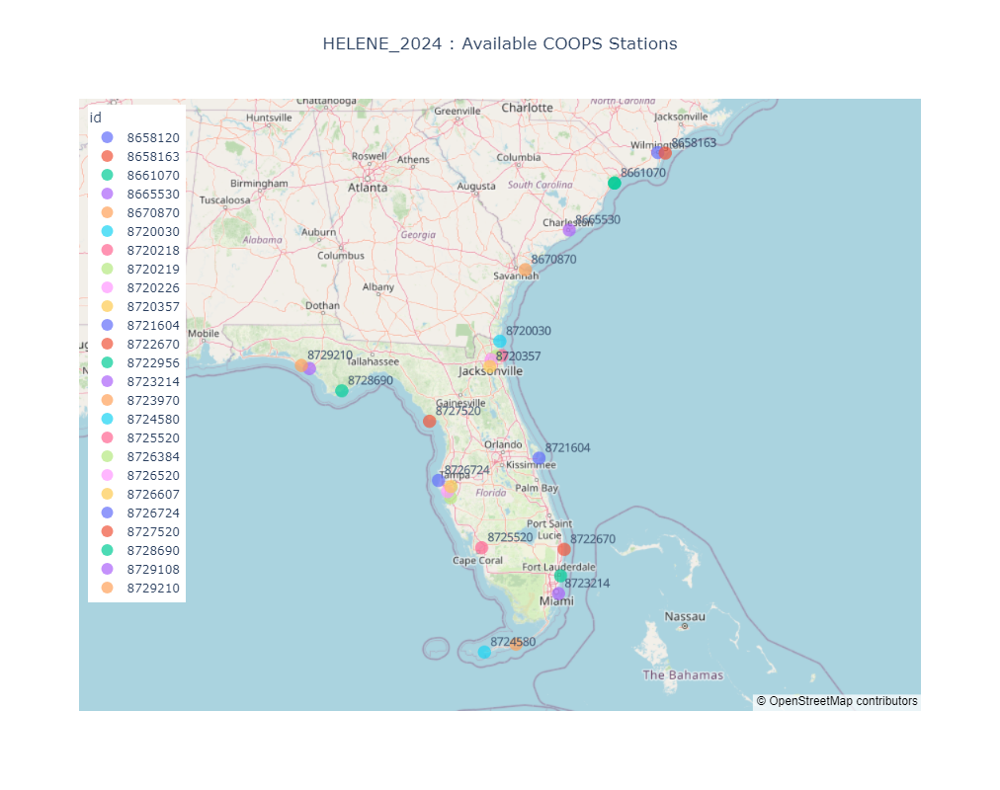

In [17]:
import plotly.express as px
import pandas as pd
import plotly.io as pio



# Create the scatter mapbox plot with red points
fig = px.scatter_mapbox(
    df_2d,
    lat='latitude',
    lon='longitude',
    center=dict(lat=df_2d['latitude'].mean(), lon=df_2d['longitude'].mean()),
    #color_discrete_sequence=['red'],  # Set the color of the points to red
    color = 'id',
    size=[1]*len(df_2d),  # Adjust the size of the markers if needed
    size_max = 10,
    text= 'id',
    hover_name='id',
    hover_data=['id', 'Name'],
    title= f'{storm_track.name}_{storm_track.year} : Available COOPS Stations',
    mapbox_style='open-street-map',  # Use OpenStreetMap for simplicity
    width=1000,  # Set the width of the figure
    height=800,  # Set the height of the figure
    zoom=5,  # Zoom level
)



fig.update_layout(
    
    title=dict(x=0.5),  # Center the title
    legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
)
)

fig.update_traces(textposition='top right')



# Show the plot
fig.show()
fig.write_html("file.html")
#fig.write_image("fig2.png")



In [18]:
# Find CO-OPS station in STOFS-2D-Global noanomaly station list

# Create an empty list to collect zeta values
zeta_values_noanomaly_list = []
x_values = []
y_values = []


# Loop over stations and extract zeta if any search string is found in the station name

station_id = np.sort(station_ds['nos_id'].values)

for nos_id in station_id:
  
    for station_index in range(len(nowcast_2d_all.station)):
        station_name = nowcast_2d_noanomaly_all.station_name[0,station_index].item().decode('utf-8').strip()
        if (nos_id in station_name):
           zeta_values = nowcast_2d_noanomaly_all.zeta[:, station_index]  # Extract zeta values for the current station
           # Save the availilbe stations in the station list
           zeta_values_noanomaly_list.append(zeta_values)
          
# Concatenate all zeta values into a single NumPy array
all_zeta_noanomaly_values = np.concatenate(zeta_values_noanomaly_list, axis=0)

all_zeta_noanomaly_values = np.reshape(all_zeta_noanomaly_values, (int(len(all_zeta_noanomaly_values)/len(nowcast_2d_noanomaly_all.time)),len(nowcast_2d_noanomaly_all.time)))


# Find CO-OPS station in STOFS-3D-Atlantic station list

In [19]:
# Create an empty list to collect zeta values
zeta_values_list_3d = []
nos_id_points_3d = []
x_values_3d = []
y_values_3d = []
names_3d = []


# Loop over stations and extract zeta if any search string is found in the station name

for nos_id in station_id:
    
     for station_index in range(len(nowcast_3d_all.station)):
        station_name = nowcast_3d_all.station_name[0,station_index].item().decode('utf-8').strip()  
        if (nos_id in station_name):
           zeta_values = nowcast_3d_all.zeta[:, station_index]  # Extract zeta values for the current station
           x = station_ds['x'][station_ds['nos_id']==nos_id]
           y = station_ds['y'][station_ds['nos_id']==nos_id]
           # Save the availilbe stations in the station list
           nos_id_points_3d.append(nos_id)
           zeta_values_list_3d.append(zeta_values)
           x_values_3d.append(x.item())
           y_values_3d.append(y.item())
           names_3d.append(station_name)
          
# Concatenate all zeta values into a single NumPy array
all_zeta_values_3d = np.concatenate(zeta_values_list_3d, axis=0)

all_zeta_values_3d = np.reshape(all_zeta_values_3d, ( int(len(all_zeta_values_3d)/len(nowcast_3d_all.time)),len(nowcast_3d_all.time)))
nos_id_points_3d , names_3d

# Sample data
data = {
    'latitude':  y_values_3d,
    'longitude': x_values_3d ,
    'Name': names_3d,
    'id':  nos_id_points_3d,
}

# Create a DataFrame
df_3d = pd.DataFrame(data)

df_3d


,latitude,longitude,Name,id
0,34.227501,-77.953613,WLON7 SOUS41 8658120 NC Wilmington,8658120
1,34.213310,-77.786690,JMPN7 SOUS41 8658163 NC Wrightsville,8658163
2,33.654999,-78.918297,MROS1 SOUS41 8661070 SC Myrtle,8661070
3,33.654999,-78.918297,MROS1 SOUS41 8661070 SC Springmaid,8661070
4,32.780830,-79.923607,"CHTS1 SOUS41 8665530 SC Charleston,",8665530
5,32.034691,-80.903030,FPKG1 SOUS41 8670870 GA Fort,8670870
6,30.671360,-81.465843,FRDF1 SOUS41 8720030 FL Fernandina,8720030
7,30.398170,-81.427887,MYPF1 SOUS41 8720218 FL Mayport,8720218
8,30.386700,-81.558296,DMSF1 SOUS41 8720219 FL Dames,8720219
9,30.320000,-81.658302,MSBF1 SOUS41 8720226 FL Southbank,8720226


# Plot the stations for STOFS-3d-Atlantic

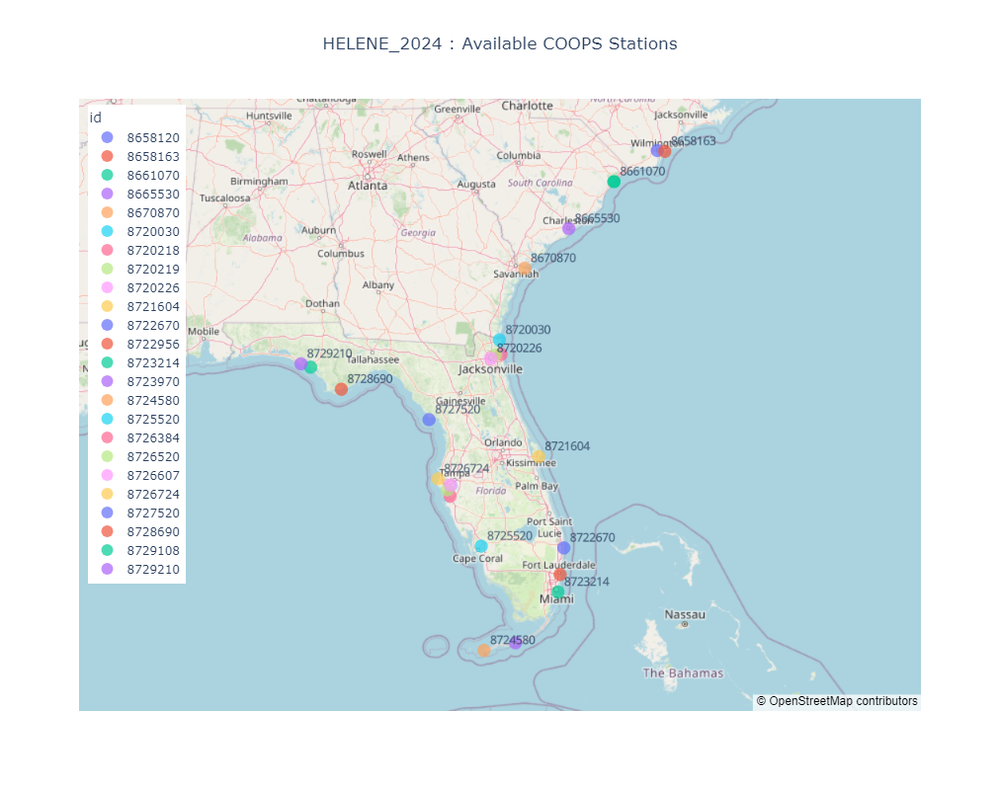

In [20]:


# Create the scatter mapbox plot with red points
fig = px.scatter_mapbox(
    df_3d,
    lat='latitude',
    lon='longitude',
    center=dict(lat=df_3d['latitude'].mean(), lon=df_3d['longitude'].mean()),
    #color_discrete_sequence=['red'],  # Set the color of the points to red
    color = 'id',
    size=[1]*len(df_3d),  # Adjust the size of the markers if needed
    size_max = 10,
    text= 'id',
    hover_name='id',
    hover_data=['id', 'Name'],
    title= f'{storm_track.name}_{storm_track.year} : Available COOPS Stations',
    mapbox_style='open-street-map',  # Use OpenStreetMap for simplicity
    width=1000,  # Set the width of the figure
    height=800,  # Set the height of the figure
    zoom=5,  # Zoom level
)



fig.update_layout(
    
    title=dict(x=0.5),  # Center the title
    legend=dict(
    yanchor="top",
    y=0.99,
    xanchor="left",
    x=0.01
)
)

fig.update_traces(textposition='top right')



# Show the plot
fig.show()
fig.write_html("file.html")
#fig.write_image("fig3.png")


# Read Observation data for STOFS-2D-Global

In [21]:
# Initialize an empty DataFrame to store the data
Observation = []

# Loop over each nos_id
for nos_id in nos_id_points:
   
       # Retrieve water level information for the specified date range
       station_df = fetch_coops_station(
       station_id=nos_id,
       start_date=datetime.fromtimestamp(nowcast_2d_all.time.values[0].astype(int) * 1e-9, tz=timezone.utc),
       end_date=datetime.fromtimestamp(nowcast_2d_all.time.values[-1].astype(int) * 1e-9, tz=timezone.utc),
       product='water_level',datum='MSL')
      

       # Add the data for the current station to the result DataFrame
       Observation.append(station_df['value'].values)


# Read Observation data for STOFS-3D-Atlantic

In [22]:

# Initialize an empty DataFrame to store the data
Observation_3d = []

# Loop over each nos_id
for nos_id in nos_id_points_3d:
   
       # Retrieve water level information for the specified date range
       station_df = fetch_coops_station(
       station_id=nos_id,
       start_date=datetime.fromtimestamp(nowcast_3d_all.time.values[0].astype(int) * 1e-9, tz=timezone.utc),
       end_date=datetime.fromtimestamp(nowcast_3d_all.time.values[-1].astype(int) * 1e-9, tz=timezone.utc),
       product='water_level',datum='NAVD')
      

       # Add the data for the current station to the result DataFrame
       Observation_3d.append(station_df['value'].values)



# Plot Nowcast Time series STOFS-2D-Global

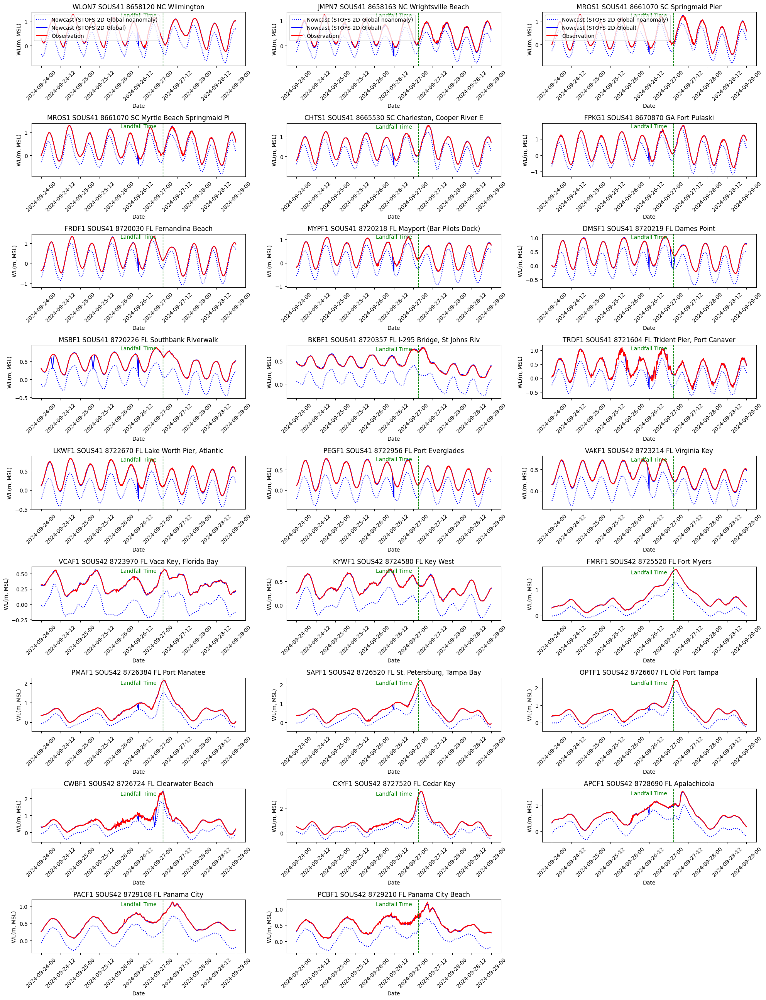

In [23]:
import matplotlib.pyplot as plt
import numpy as np
from datetime import timedelta

def convert_to_datetime(time_step, date_range):
    start_date = datetime.strptime(date_range[0], '%Y%m%d')
    time_delta = timedelta(minutes=6)
    return start_date + time_step * time_delta

# Define the number of rows and columns for subplots (2 columns)
num_rows = 9
num_cols = 3

# Create a figure and axes array with subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 26))

index = 0
for row in range(num_rows):
    for col in range(num_cols):
        
        if index >= len(nos_id_points):
            # If there are fewer stations than subplots, turn off unused subplots
            axs[row, col].axis('off')
            break
        ax = axs[row, col]
    
        ax.plot(all_zeta_noanomaly_values[index, :], label='Nowcast (STOFS-2D-Global-noanomaly)', color='blue', linestyle='dotted')
        #ax.plot(all_zeta_para_values[index, :], label='Nowcast (STOFS-2D-Global-new)', color='blue', linestyle='dashed')
        ax.plot(all_zeta_values[index, :], label='Nowcast (STOFS-2D-Global)', color='blue')
        ax.plot(Observation[index], label='Observation', color='red')
        ax.set_title(names[index])
            
        ax.set_xlabel('Date')
            
        # Set x ticks and labels
        ax.set_xticks(range(0, len(all_zeta_values[index, :]), 120))
        time_steps = range(0, len(all_zeta_values[index, :]))
        time_labels = [convert_to_datetime(step, date_range) for step in time_steps]
        selected_dates = time_labels[::120]
        ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
            
            
        ax.axvline(x=landfall_time_step*10, color='green', linestyle='--', linewidth=1)
        ax.text(landfall_time_step*10*0.8, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
            
        ax.set_ylabel('WL(m, MSL)')
        if row == 0 :
            ax.legend(loc='upper left')
        
        index += 1
            
          
# Adjust layout
plt.tight_layout()
plt.savefig(f'nowcast_2d_{Event_name}')  # Save the figure
plt.show()

# Plot Nowcast Time series STOFS-3D-Atlantic

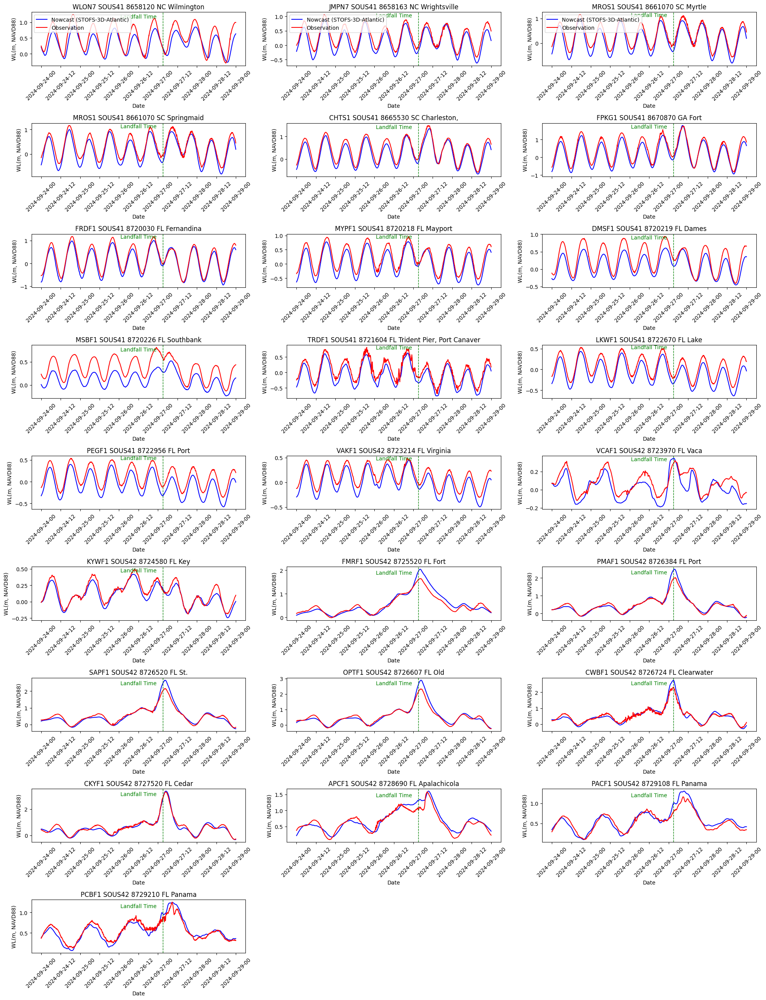

In [24]:
import matplotlib.pyplot as plt
import numpy as np
from datetime import timedelta

def convert_to_datetime(time_step, date_range):
    start_date = datetime.strptime(date_range[0], '%Y%m%d')
    time_delta = timedelta(minutes=6)
    return start_date + time_step * time_delta

# Define the number of rows and columns for subplots (2 columns)
num_rows = 9
num_cols = 3

# Create a figure and axes array with subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 26))

index = 0
for row in range(num_rows):
    for col in range(num_cols):
        ax = axs[row, col]
        if index == len(nos_id_points_3d):
            # If there are fewer stations than subplots, turn off unused subplots
            ax.axis('off')
            continue
        
    
        #ax.plot(all_zeta_noanomaly_values[index, :], label='Nowcast (STOFS-2D-Global-noanomaly)', color='blue', linestyle='dotted')
        #ax.plot(all_zeta_para_values[index, :], label='Nowcast (STOFS-2D-Global-new)', color='blue', linestyle='dashed')
        ax.plot(all_zeta_values_3d[index, :], label='Nowcast (STOFS-3D-Atlantic)', color='blue')
        ax.plot(Observation_3d[index], label='Observation', color='red')
        ax.set_title(names_3d[index])
            
        ax.set_xlabel('Date')
            
        # Set x ticks and labels
        ax.set_xticks(range(0, len(all_zeta_values_3d[index, :]), 120))
        time_steps = range(0, len(all_zeta_values_3d[index, :]))
        time_labels = [convert_to_datetime(step, date_range) for step in time_steps]
        selected_dates = time_labels[::120]
        ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
                        
        ax.axvline(x=landfall_time_step*10, color='green', linestyle='--', linewidth=1)
        ax.text(landfall_time_step*0.8*10, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
            
        ax.set_ylabel('WL(m, NAVD88)')
        if row == 0:
            ax.legend(loc='upper left')
        
        index += 1

# Turn off any remaining unused subplots 
for i in range(index, num_rows * num_cols): 
    axs.flatten()[i].axis('off')

# Adjust layout
plt.tight_layout()
plt.savefig(f'nowcast_3d_{Event_name}')  # Save the figure
plt.show()

# Read STOFS-2d-Global Forecast Data on the Fly 

In [25]:
# Read STOFS-2d-global

bucket_name = bucket_name_2d
start_date = datetime.strptime(date_range[0], '%Y%m%d')
end_date = datetime.strptime(date_range[1], '%Y%m%d')
end_date += timedelta(days=1) # to include all nowcast data for the specified rage

dates = []
current_date = start_date
while current_date <= end_date:
    dates.append(current_date.strftime('%Y%m%d'))  # Format as YYYY-MM-DD
    current_date += timedelta(days=1)

# Find the forecast date
date = (start_date + timedelta(hours=landfall_time_step-Hours_before_landfall)).strftime('%Y%m%d')
print(date)
# Find the Forecast cycle
date_H = int((start_date + timedelta(hours=landfall_time_step-Hours_before_landfall)).strftime('%H'))

cycle = None
for num in cycles_2d:
    if int(num) < date_H:
        if cycle is None or int(num) > cycle:
            cycle = int(num)
cycle = f'{cycle:02}'

filename = 'points.cwl'
modelname = 'stofs_2d_glo'
directoryname = ''
bucketname = 'noaa-gestofs-pds'

forecast_2d = get_station_data(filename, modelname, directoryname, bucketname, date, cycle)

forecast_2d

20240926


<xarray.Dataset> Size: 25MB
Dimensions:       (time: 1860, station: 1688)
Coordinates:
  * time          (time) datetime64[ns] 15kB 2024-09-25T18:06:00 ... 2024-10-...
Dimensions without coordinates: station
Data variables:
    station_name  (station) |S50 84kB ...
    x             (station) float64 14kB ...
    y             (station) float64 14kB ...
    zeta          (time, station) float64 25MB ...
Attributes: (12/50)
    dry_Value:          -99999.0
    model:              ADCIRC
    version:            noaa.stofs.2d.glo.v2.1.0r1.v55.12
    git_hash:           23947fbd9683d0ef48f12e6ce62d45d18bc27ff3
    grid_type:          Triangular
    description:        2024092600 :-6 hr nowcast and +180 hr forecast ! 32 C...
    ...                 ...
    sfea0:              45.0
    cf:                 0.0005
    eslm:               -0.2
    cori:               0.0
    ntif:               8
    nbfr:               0

In [26]:
filename = 'points.cwl.noanomaly'
modelname = 'stofs_2d_glo'
directoryname = ''
bucketname = 'noaa-gestofs-pds'

forecast_2d_noanomaly = get_station_data(filename, modelname, directoryname, bucketname, date, cycle)
forecast_2d_noanomaly 

<xarray.Dataset> Size: 25MB
Dimensions:       (time: 1860, station: 1688)
Coordinates:
  * time          (time) datetime64[ns] 15kB 2024-09-25T18:06:00 ... 2024-10-...
Dimensions without coordinates: station
Data variables:
    station_name  (station) |S50 84kB ...
    x             (station) float64 14kB ...
    y             (station) float64 14kB ...
    zeta          (time, station) float64 25MB ...
Attributes: (12/51)
    _FillValue:         -99999.0
    dry_Value:          -99999.0
    model:              ADCIRC
    version:            noaa.stofs.2d.glo.v2.1.0r1.v55.12
    git_hash:           23947fbd9683d0ef48f12e6ce62d45d18bc27ff3
    grid_type:          Triangular
    ...                 ...
    sfea0:              45.0
    cf:                 0.0005
    eslm:               -0.2
    cori:               0.0
    ntif:               8
    nbfr:               0

# Read STOFS-3d-Atlantic Forecast Data on the Fly 

In [27]:
# Read STOFS-3d-Atlantic

bucket_name = bucket_name_3d
start_date = datetime.strptime(date_range[0], '%Y%m%d')
end_date = datetime.strptime(date_range[1], '%Y%m%d')
end_date += timedelta(days=1) # to include all nowcast data for the specified rage

dates = []
current_date = start_date
while current_date <= end_date:
    dates.append(current_date.strftime('%Y%m%d'))  # Format as YYYY-MM-DD
    current_date += timedelta(days=1)


# Find the forecast date
date = (start_date + timedelta(hours=landfall_time_step-Hours_before_landfall)).strftime('%Y%m%d')
print(date)


filename = 'points.cwl'
modelname = 'stofs_3d_atl'
directoryname = 'STOFS-3D-Atl'
bucketname = 'noaa-nos-stofs3d-pds'
cycle = '12'

forecast_3d = get_station_data(filename, modelname, directoryname, bucketname, date, cycle)

forecast_3d


20240926


<xarray.Dataset> Size: 5MB
Dimensions:       (time: 1200, station: 108)
Coordinates:
  * time          (time) datetime64[ns] 10kB 2024-09-25T12:06:00 ... 2024-09-...
Dimensions without coordinates: station
Data variables:
    zeta          (time, station) float64 1MB ...
    station_name  (station) |S50 5kB ...
    x             (station) float64 864B ...
    y             (station) float64 864B ...
    u             (time, station) float64 1MB ...
    v             (time, station) float64 1MB ...
    salinity      (time, station) float64 1MB ...
    temperature   (time, station) float64 1MB ...
Attributes:
    title:       SCHISM Model output
    source:      SCHISM model output version v10
    references:  http://ccrm.vims.edu/schismweb/
    history:     Thu Sep 26 18:04:34 2024: ncap2 -O -F -S /lfs/h1/ops/prod/pa...
    NCO:         netCDF Operators version 4.9.7 (Homepage = http://nco.sf.net...

# Collect Forecast data at CO-OPS stations in STOFS-2D-Global station list

In [28]:
# Create an empty list to collect zeta values
zeta_values_list = []
nos_id_points = []
x_values = []
y_values = []
names = []


# Loop over stations and extract zeta if any search string is found in the station name


    
for nos_id in station_id:
  

   for station_index in range(len(forecast_2d.station)):
        station_name = forecast_2d.station_name[station_index].item().decode('utf-8').strip()  
        if (nos_id in station_name):
           print(nos_id)
           zeta_values = forecast_2d.zeta[:, station_index]  # Extract zeta values for the current station
           x = forecast_2d.x[station_index]
           y = forecast_2d.y[station_index]
           # Save the availilbe stations in the station list
           nos_id_points.append(nos_id)
           zeta_values_list.append(zeta_values)
           x_values.append(x.item())
           y_values.append(y.item())
           names.append(station_name)
          
# Concatenate all zeta values into a single NumPy array
forecast_all_zeta_values = np.concatenate(zeta_values_list, axis=0)

forecast_all_zeta_values = np.reshape(forecast_all_zeta_values, (int(len(forecast_all_zeta_values)/len(forecast_2d.time)),len(forecast_2d.time)))


8658120
8658163
8661070
8661070
8665530
8670870
8720030
8720218
8720219
8720226
8720357
8721604
8722670
8722956
8723214
8723970
8724580
8725520
8726384
8726520
8726607
8726724
8727520
8728690
8729108
8729210


In [29]:
# Create an empty list to collect zeta values
zeta_values_list_noanomaly = []
nos_id_points = []
x_values_noanomaly = []
y_values_noanomaly = []
names_noanomaly = []


# Loop over stations and extract zeta if any search string is found in the station name


    
for nos_id in station_id:
  

   for station_index in range(len(forecast_2d.station)):
        station_name = forecast_2d_noanomaly.station_name[station_index].item().decode('utf-8').strip()  
        if (nos_id in station_name):
           print(nos_id)
           zeta_values = forecast_2d_noanomaly.zeta[:, station_index]  # Extract zeta values for the current station
           x = forecast_2d_noanomaly.x[station_index]
           y = forecast_2d_noanomaly.y[station_index]
           # Save the availilbe stations in the station list
           nos_id_points.append(nos_id)
           zeta_values_list_noanomaly.append(zeta_values)
           x_values_noanomaly.append(x.item())
           y_values_noanomaly.append(y.item())
           names_noanomaly.append(station_name)
          
# Concatenate all zeta values into a single NumPy array
forecast_all_zeta_values_noanomaly = np.concatenate(zeta_values_list_noanomaly, axis=0)

forecast_all_zeta_values_noanomaly = np.reshape(forecast_all_zeta_values_noanomaly, (int(len(forecast_all_zeta_values_noanomaly)/len(forecast_2d_noanomaly.time)),len(forecast_2d_noanomaly.time)))


8658120
8658163
8661070
8661070
8665530
8670870
8720030
8720218
8720219
8720226
8720357
8721604
8722670
8722956
8723214
8723970
8724580
8725520
8726384
8726520
8726607
8726724
8727520
8728690
8729108
8729210


# Collect Forecast data at CO-OPS stations in STOFS-3D_Atlantic station list

In [30]:
# Create an empty list to collect zeta values
zeta_values_list = []
nos_id_points_3d = []
x_values = []
y_values = []
names_3d = []


# Loop over stations and extract zeta if any search string is found in the station name

    
for nos_id in station_id:
    
    for station_index in range(len(forecast_3d.station)):
        station_name = forecast_3d.station_name[station_index].item().decode('utf-8').strip()  
        if (nos_id in station_name):
           print(nos_id)
           zeta_values = forecast_3d.zeta[:, station_index]  # Extract zeta values for the current station
           x = forecast_3d.x[station_index]
           y = forecast_3d.y[station_index]
           # Save the availilbe stations in the station list
           nos_id_points_3d.append(nos_id)
           zeta_values_list.append(zeta_values)
           x_values.append(x.item())
           y_values.append(y.item())
           names_3d.append(station_name)
          
# Concatenate all zeta values into a single NumPy array
forecast_3d_all_zeta_values = np.concatenate(zeta_values_list, axis=0)

forecast_3d_all_zeta_values = np.reshape(forecast_3d_all_zeta_values, (int(len(forecast_3d_all_zeta_values)/len(forecast_3d.time)),len(forecast_3d.time)))


8658120
8658163
8661070
8661070
8665530
8670870
8720030
8720218
8720219
8720226
8721604
8722670
8722956
8723214
8723970
8724580
8725520
8726384
8726520
8726607
8726724
8727520
8728690
8729108
8729210


# Collect the observation data for STOFS-2D-Global

In [31]:

# Initialize an empty DataFrame to store the data
Observation_2d_forecast = []

# Loop over each nos_id
for nos_id in nos_id_points:
   
       # Retrieve water level information for the specified date range
       station_df = fetch_coops_station(
       station_id=nos_id,
       start_date=datetime.fromtimestamp(forecast_2d.time.values[0].astype(int) * 1e-9, tz=timezone.utc),
       end_date=datetime.fromtimestamp(forecast_2d.time.values[-1].astype(int) * 1e-9, tz=timezone.utc),
       product='water_level',datum='MSL')
      

       # Add the data for the current station to the result DataFrame
       Observation_2d_forecast.append(station_df['value'].values)



# Collect the observation data for STOFS-3D-Atlantic

In [32]:

# Initialize an empty DataFrame to store the data
Observation_3d_forecast = []

# Loop over each nos_id
for nos_id in nos_id_points_3d:
   
       # Retrieve water level information for the specified date range
       station= searvey.coops.COOPS_Station(int(nos_id)) 
       station_df = fetch_coops_station(
       station_id=nos_id,
       start_date=datetime.fromtimestamp(forecast_3d.time.values[0].astype(int) * 1e-9, tz=timezone.utc),
       end_date=datetime.fromtimestamp(forecast_3d.time.values[-1].astype(int) * 1e-9, tz=timezone.utc),
       product='water_level',datum='NAVD')
    
      

       # Add the data for the current station to the result DataFrame
       Observation_3d_forecast.append(station_df['value'].values)

# Plot Forecast for STOFS-2D-Global

# Create a figure for STOFS-2D-Global forecast data

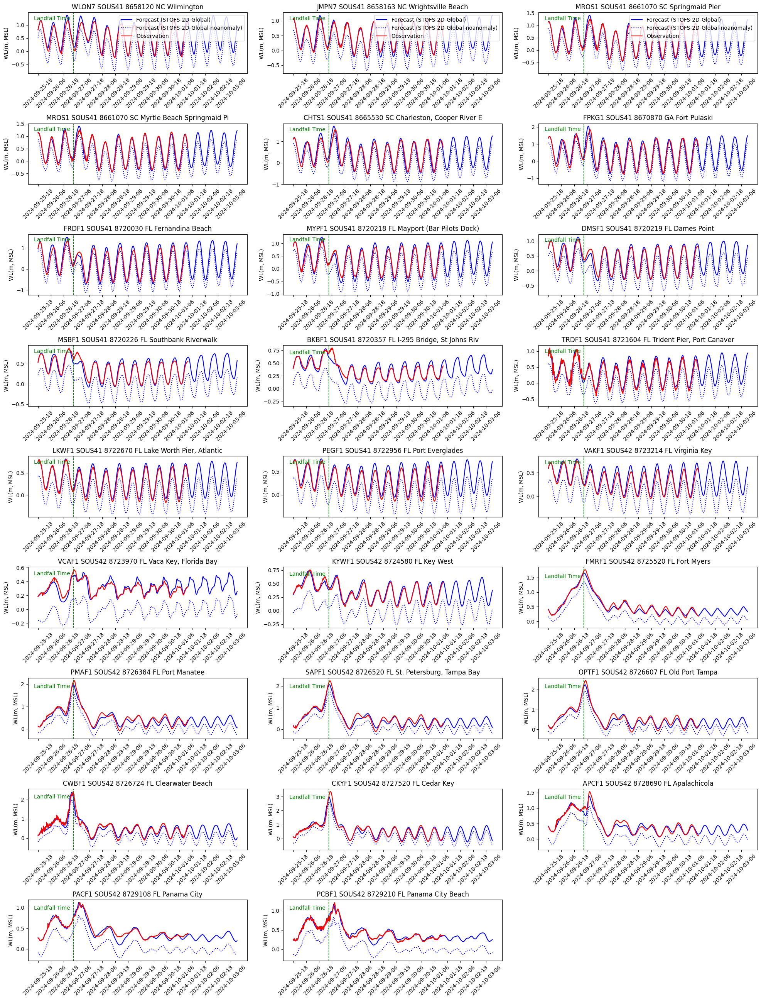

In [33]:


def convert_to_datetime(time_step):
    start_date = datetime.fromtimestamp(forecast_2d.time.values[0].astype(int) * 1e-9, tz=timezone.utc)
    time_delta = timedelta(minutes=6)
    return start_date + time_step * time_delta


fig, axs = plt.subplots(nrows=9, ncols=3, figsize=(20, 26))  # 4 rows, 2 columns


index = 0


for row in range(9):  
    for col in range(3):  
        if index >= len(nos_id_points):
           # If there are fewer stations than subplots, turn off unused subplots
           axs[row, col].axis('off')
           break
            
        if index < len(nos_id_points):
            ax = axs[row, col]
           
            ax.plot(forecast_all_zeta_values[index, :], label='Forecast (STOFS-2D-Global)', color='blue')
            ax.plot(forecast_all_zeta_values_noanomaly[index,:], label='Forecast (STOFS-2D-Global-noanomaly)', color='blue', linestyle='dotted')

            ax.plot(Observation_2d_forecast[index], label='Observation', color='red')
            
            ax.set_title(names[index])

            ax.set_xticks(range(0, len(forecast_all_zeta_values[index, :]), 120)) 
            time_steps = range(0, len(forecast_all_zeta_values[index, :]))
            time_labels = [convert_to_datetime(step) for step in time_steps]
            
            # Calculate the landfall time step
            start_date = datetime.strptime(date_range[0], '%Y%m%d')
 
            landfall_datetime = start_date + timedelta(hours=landfall_time_step)
            
            forecast_2d_landfall_time_step = None 
            
            for step, time_label in zip(time_steps, time_labels): 
                if time_label.replace(tzinfo = None) == landfall_datetime:
                    forecast_2d_landfall_time_step = step 
                    break   
        

            selected_dates = time_labels[::120]
            ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
        
            ax.axvline(x=forecast_2d_landfall_time_step, color='green', linestyle='--', linewidth=1)
            ax.text(forecast_2d_landfall_time_step*0.4, ax.get_ylim()[1]*0.8, 'Landfall Time', color='green', ha='center')
            
            ax.set_ylabel('WL(m, MSL)')
            if row == 0 :
                ax.legend(loc='upper right')
        
        index += 1


plt.tight_layout()
plt.savefig(f'Forecast_2d_{Event_name}')  # Save the figure
plt.show()



# Plot Forecast for STOFS-3D-Atlantic

# Create a figure for STOFS-3D-Atlantic forecast data

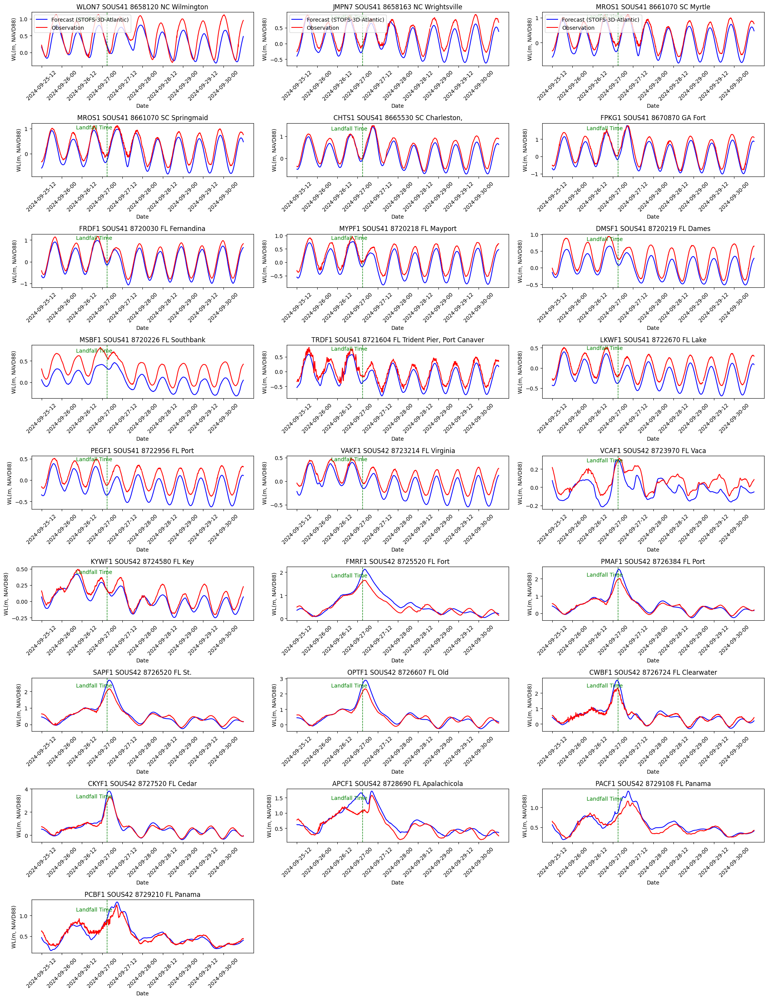

In [34]:

def convert_to_datetime(time_step):
    start_date = datetime.fromtimestamp(forecast_3d.time.values[0].astype(int) * 1e-9, tz=timezone.utc)
    time_delta = timedelta(minutes=6)
    return start_date + time_step * time_delta


fig, axs = plt.subplots(nrows=9, ncols=3, figsize=(20, 26))  # 4 rows, 2 columns


index = 0


for row in range(9):  
    for col in range(3):  
        ax = axs[row, col]
        if index >= len(nos_id_points_3d):
           # If there are fewer stations than subplots, turn off unused subplots
           ax.axis('off')
           break
            
        if index < len(nos_id_points_3d):
            
            ax.plot(forecast_3d_all_zeta_values[index, :], label='Forecast (STOFS-3D-Atlantic)', color='blue')

            ax.plot(Observation_3d_forecast[index], label='Observation', color='red')
            
            ax.set_title(names_3d[index])
            
            ax.set_xlabel('Date')
            
            # Set x ticks and labels
            ax.set_xticks(range(0, len(forecast_3d_all_zeta_values[index, :]), 120)) 
            time_steps = range(0, len(forecast_3d_all_zeta_values[index, :]))
            time_labels = [convert_to_datetime(step) for step in time_steps]
            
            # Calculate the landfall time step
            start_date = datetime.strptime(date_range[0], '%Y%m%d')
            landfall_datetime = start_date + timedelta(hours=landfall_time_step)
 
            forecast_3d_landfall_time_step = None 
            
            for step, time_label in zip(time_steps, time_labels): 
                if time_label.replace(tzinfo = None) == landfall_datetime:
                    forecast_3d_landfall_time_step = step 
                    break   
        
            selected_dates = time_labels[::120]
            ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
   
            ax.axvline(x=forecast_3d_landfall_time_step, color='green', linestyle='--', linewidth=1)
            ax.text(forecast_3d_landfall_time_step*0.8, ax.get_ylim()[1]*0.8, 'Landfall Time', color='green', ha='center')
            
            ax.set_ylabel('WL(m, NAVD88)')
            if row == 0 :
                ax.legend(loc='upper left')
        
        index += 1
        
# Turn off any remaining unused subplots 
for i in range(index, num_rows * num_cols): 
    axs.flatten()[i].axis('off')


plt.tight_layout()
plt.savefig(f'forecast_3d_{Event_name}')  # Save the figure
plt.show()


# Find CO-OPS wind observational stations

In [114]:
if Region == 'NaN':
   bbox = storm_track.wind_swaths(wind_speed=34)[advisory][track_date]
else:
   bbox = shapely.box(Region[0], Region[2], Region[1], Region[3])

all_stations = get_coops_stations(metadata_source='main', region=bbox)
#wind_stations = all_stations[((all_stations.status == 'active') & (all_stations.station_type == 'met')) | (all_stations.status == 'active') & (all_stations.station_type == 'waterlevelsandmet') ]
wind_stations = all_stations[((all_stations.status == 'active') & (all_stations.station_type == 'met'))]

wind_stations = wind_stations.sort_values(by ='nos_id')
wind_stations = wind_stations.reset_index()


wind_stations

100%|███████████████████████████████████████████████████████████████████████████████████| 28/28 [00:09<00:00,  3.11it/s]


,nos_id,nws_id,station_type,name,state,lon,lat,removed,status,geometry
0,8658120,WLON7,met,Wilmington,NC,-77.953613,34.227501,NaT,active,POINT (-77.95361 34.22750)
1,8658163,JMPN7,met,Wrightsville Beach,NC,-77.786667,34.213333,NaT,active,POINT (-77.78667 34.21333)
2,8661070,MROS1,met,Springmaid Pier,SC,-78.918297,33.654999,NaT,active,POINT (-78.91830 33.65500)
3,8665530,CHTS1,met,Charleston,SC,-79.923889,32.775002,NaT,active,POINT (-79.92389 32.77500)
4,8670870,FPKG1,met,Fort Pulaski,GA,-80.903030,32.034695,NaT,active,POINT (-80.90303 32.03469)
5,8679598,KBMG1,met,Kings Bay MSF Pier,GA,-81.491402,30.778099,NaT,active,POINT (-81.49140 30.77810)
6,8720030,FRDF1,met,Fernandina Beach,FL,-81.465843,30.671356,NaT,active,POINT (-81.46584 30.67136)
7,8720215,NFDF1,met,Navy Fuel Depot,FL,-81.626663,30.400000,NaT,active,POINT (-81.62666 30.40000)
8,8720218,MYPF1,met,Mayport (Bar Pilots Dock),FL,-81.427887,30.398167,NaT,active,POINT (-81.42789 30.39817)
9,8720219,DMSF1,met,Dames Point,FL,-81.559166,30.387222,NaT,active,POINT (-81.55917 30.38722)


# Read wind Observation data

In [37]:
station_id = '8726384'
station_wind = fetch_coops_station(
    station_id=station_id,
    start_date=datetime.fromtimestamp(nowcast_2d_all.time.values[0].astype(int) * 1e-9, tz=timezone.utc),
    end_date=datetime.fromtimestamp(nowcast_2d_all.time.values[-1].astype(int) * 1e-9, tz=timezone.utc),
    product='wind',  interval='h'
)
station_wind

8726384: Encountered an error response for {'station_id': '8726384', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8726384&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240924%2000%3A00&end_date=20240929%2000%3A00'), 'client': <httpx.Client object at 0x2ad20363fb90>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2ad20363d580>, 'product': <COOPS_Product.WIND: 'wind'>, 'redirect': True}!
--> No data was found. This product may not be offered at this station at the requested time.
COOPS-8726384: No data. Creating a dummy dataframe


""
time


In [116]:
station_id = '8726384'
station_wind = fetch_coops_station(
    station_id=station_id,
    start_date=datetime.fromtimestamp(nowcast_2d_all.time.values[0].astype(int) * 1e-9, tz=timezone.utc),
    end_date=datetime.fromtimestamp(nowcast_2d_all.time.values[-1].astype(int) * 1e-9, tz=timezone.utc),
    product='air_pressure',  interval='h'
)
station_wind

,value,flags
time,,
2024-09-24 00:00:00+00:00,1011.8,"0,0,0"
2024-09-24 01:00:00+00:00,1012.2,"0,0,0"
2024-09-24 02:00:00+00:00,1012.9,"0,0,0"
2024-09-24 03:00:00+00:00,1013.2,"0,0,0"
2024-09-24 04:00:00+00:00,1013.3,"0,0,0"
...,...,...
2024-09-28 20:00:00+00:00,1012.0,"0,0,0"
2024-09-28 21:00:00+00:00,1011.8,"0,0,0"
2024-09-28 22:00:00+00:00,1012.0,"0,0,0"


# Read GFS Nowcast on the Fly

In [209]:


def find_index_closest_data(ds, stations):
    lat_indices = {}
    lon_indices = {}
    
    for y_val, x_val, nos_id in zip(stations['lat'], stations['lon'], stations['nos_id']): 
        longitude_adjusted = float(x_val) + 360 if float(x_val) < 0 else float(x_val)
        
        # Get the nearest indices for latitude and longitude
        lat_idx = np.where((np.abs(ds['latitude'][0:4718592:3072] - float(y_val))) == np.min(np.abs(ds['latitude'][0:4718592:3072] -                          float(y_val))))
        lon_idx = np.where((np.abs(ds['longitude'][0:3072] - longitude_adjusted)) == np.min(np.abs(ds['longitude'][0:3072] -                                  longitude_adjusted)))
       
        # Store indices in dictionaries 
        lat_indices[nos_id] = lat_idx 
        lon_indices[nos_id] = lon_idx

    return lat_indices, lon_indices

def fetch_gfs_Nowcast_data(start_date, end_date, cycles, stations, num_time_steps):
    """
    Function to fetch GFS data for specified dates and cycles and return a DataFrame with wind and pressure information.

    Parameters:
    - start_date (str): The start date in 'YYYYMMDD' format.
    - end_date (str): The end date in 'YYYYMMDD' format.
    - cycles (list of str): List of cycles (e.g., ['00', '06', '12', '18']).
    - stations (DataFrame): DataFrame containing station information (lat, lon, nos_id).
    - num_time_steps (int): Number of time steps to retrieve from each cycle.

    Returns:
    - pd.DataFrame: DataFrame containing the time, u_wind, v_wind, and surface pressure.
    """
    
    # Initialize a list to store data for the DataFrame
    u_wind_dfs = pd.DataFrame()
    v_wind_dfs = pd.DataFrame()
    surface_pressure_dfs = pd.DataFrame()

    # Initialize list to store all time information 
    all_times = []


    # Generate date list
    dates = []
    current_date = datetime.strptime(start_date, '%Y%m%d')
    end_date = datetime.strptime(end_date, '%Y%m%d')

    while current_date <= end_date:
        dates.append(current_date.strftime('%Y%m%d'))
        current_date += timedelta(days=1)

    for date in dates:
        print(date)
        for i, cycle in enumerate(cycles):
            for hour in range(0, num_time_steps, 1):  # Loop over specified number of time steps
                # Adjust date for the previous cycle if needed

                key = f'gfs.{date}/{cycle}/atmos/gfs.t{cycle}z.sfluxgrbf{hour:03d}.grib2'
                time = datetime.strptime(date, '%Y%m%d') + timedelta(hours=int(cycle)) + timedelta(hours=hour)

                print(key)    
                url = f"s3://noaa-gfs-bdp-pds/{key}"

                # Fetch the GRIB2 data from S3
                try:
                    s3 = s3fs.S3FileSystem(anon=True)
                    with s3.open(url, 'rb') as f:
                        grib_data = f.read()
                except Exception as e:
                    print(f"Error fetching data from {url}: {e}")
                    continue

                # Define variable names of interest
                variable_names = ['Surface pressure', '10 metre U wind component', '10 metre V wind component']
                data_arrays = {var_name: [] for var_name in variable_names}

                # Read GRIB2 data
                with tempfile.NamedTemporaryFile(suffix=".grib2") as tmp_file:
                    tmp_file.write(grib_data)
                    tmp_file.seek(0)
                    grbs = pygrib.open(tmp_file.name)

                    for grb in grbs:
                        if grb['name'] in variable_names:
                            data_arrays[grb['name']].append(grb.values)

                    grbs.close()


                # Convert data arrays to xarray DataArrays
                pressure_data = xr.DataArray(np.array(data_arrays['Surface pressure']), name='surface_pressure')
                u_wind_data = xr.DataArray(np.array(data_arrays['10 metre U wind component']), name='u_wind')
                v_wind_data = xr.DataArray(np.array(data_arrays['10 metre V wind component']), name='v_wind')

                print(hour)
                # Create an xarray Dataset
                ds = xr.Dataset(
                data_vars={
                'surface_pressure': pressure_data,
                'u_wind': u_wind_data,
                'v_wind': v_wind_data},
                coords={
                'latitude': grb.latitudes,  # Assuming latitudes are the same for all messages
                'longitude': grb.longitudes,},
                attrs={
                'description': 'GRIB Data Example'})


                # Rename the dimensions 'dim_0', 'dim_1', 'dim_2' to 'time', 'y', 'x'
                ds = ds.rename({'dim_0': 'time', 'dim_1': 'y', 'dim_2': 'x'})
                # Initialize empty DataFrames to store wind and pressure data for this hour
                u_wind_df = pd.DataFrame()
                v_wind_df = pd.DataFrame()
                surface_pressure_df = pd.DataFrame()
                   
                # Extract values for  stations
                if not all_times:
                    lat_indices, lon_indices = find_index_closest_data(ds, stations)  
                    print(lat_indices)
             
                for nos_id in  stations['nos_id']:
                    # Extract the forcing data using the index
                    u_wind_value = ds.u_wind[0, lat_indices[nos_id][0][0], lon_indices[nos_id][0][0]].values
                    v_wind_value = ds.v_wind[0, lat_indices[nos_id][0][0], lon_indices[nos_id][0][0]].values
                    surface_pressure_value = ds.surface_pressure[0, lat_indices[nos_id][0][0], lon_indices[nos_id][0][0]].values


                    # Append the values to the respective DataFrames as columns with NOS ids as column names
                    u_wind_df[int(nos_id)] = [np.round(u_wind_value, 2)]
                    v_wind_df[int(nos_id)]= [np.round(v_wind_value, 2)]
                    surface_pressure_df[int(nos_id)] = [np.round(surface_pressure_value, 2)]
            
                # Append data for each station to the list
                u_wind_dfs = pd.concat([u_wind_dfs, u_wind_df], ignore_index=True)
                v_wind_dfs = pd.concat([v_wind_dfs, v_wind_df], ignore_index=True)
                surface_pressure_dfs = pd.concat([surface_pressure_dfs, surface_pressure_df], ignore_index=True)
            
                # Store the time information 
                all_times.append(time) 

    return u_wind_dfs, v_wind_dfs, surface_pressure_dfs, all_times


def fetch_gfs_Forecast_data(date, cycle, stations):
    """
    Function to fetch GFS data for date and cycle used as the STOFS forcing data and return a DataFrame with wind and pressure information.

    Parameters:
    - date (str): The date in 'YYYYMMDD' format.
    - cycle (str): cycle (e.g., ['00', '06', '12', '18']).
    - stations (DataFrame): DataFrame containing station information (lat, lon, nos_id).

    Returns:
    - pd.DataFrames: DataFrame containing the time, u_wind, v_wind, and surface pressure.
    """
    
    # Initialize a list to store data for the DataFrame
    u_wind_dfs = pd.DataFrame()
    v_wind_dfs = pd.DataFrame()
    surface_pressure_dfs = pd.DataFrame()

    # Initialize list to store all time information 
    all_times = []

    # list of cycles in STOFS-2dd-Global
    cycles_2d = ['00', '06', '12', '18']  


    # Generate date list
    for hour in range(0, 121, 1):  # Assuming we want to loop from 0 to 120 hours
            print(hour)
            if hour < 6:
                if cycle == '00':
                        current_date = datetime.strptime(date, '%Y%m%d') 
                        current_date -= timedelta(days=1) # Go back one day 
                        date_one_day_back = current_date.strftime('%Y%m%d')
                        previous_cycle = '18'

                        # Define the filename and the location of the GRIB2 file
                        key = f'gfs.{date_one_day_back}/{previous_cycle}/atmos/gfs.t{previous_cycle}z.sfluxgrbf{hour:03d}.grib2'
                        url = f"s3://noaa-gfs-bdp-pds/{key}"
                        time = datetime.strptime(date_one_day_back, '%Y%m%d') + timedelta(hours=int(previous_cycle)) + timedelta(hours=hour) 
                        print(time)
                else:
                        
                        
                        previous_cycle = cycles_2d[cycles_2d.index(cycle) - 1] 
                         
                        # Define the filename and the location of the GRIB2 file
                        key = f'gfs.{date}/{previous_cycle}/atmos/gfs.t{previous_cycle}z.sfluxgrbf{(hour):03d}.grib2'
                        url = f"s3://noaa-gfs-bdp-pds/{key}"
                        print(url)
                        #time = datetime.strptime(date, '%Y%m%d') + timedelta(hours=int(previous_cycle)) + timedelta(hours=hour) 
                        time = datetime.strptime(date, '%Y%m%d') + timedelta(hours=int(previous_cycle)) + timedelta(hours=hour)
                        print(time)
            else: 
                
                # Define the filename and the location of the GRIB2 file
                key = f'gfs.{date}/{cycle}/atmos/gfs.t{cycle}z.sfluxgrbf{(hour-6):03d}.grib2'
                url = f"s3://noaa-gfs-bdp-pds/{key}"
                print(url)
                time = datetime.strptime(date, '%Y%m%d') + timedelta(hours=int(cycle))+ timedelta(hours=hour-6) 
                print(time)
                

            # Fetch the GRIB2 data from S3
            s3 = s3fs.S3FileSystem(anon=True)
            with s3.open(url, 'rb') as f:
                 grib_data = f.read()


            # Define the variable names of interest
            variable_names = ['Surface pressure', '10 metre U wind component', '10 metre V wind component']


            # Initialize empty arrays to store data
            data_arrays = {var_name: [] for var_name in variable_names}


            # Save the GRIB2 data to a temporary file
            with tempfile.NamedTemporaryFile(suffix=".grib2") as tmp_file:
                 tmp_file.write(grib_data)
                 tmp_file.seek(0)  # Reset file pointer to the beginning
                 # Read the GRIB2 data using pygrib from the temporary file
                 grbs = pygrib.open(tmp_file.name)


                 # Iterate over each message in the GRIB2 file
                 for grb in grbs:
                     # Check if the message corresponds to one of the variables of interest
                 
                     if grb['name'] in variable_names:
                        # Append data to the corresponding array
                        data_arrays[grb['name']].append(grb.values)

                 # Close the GRIB2 file
                 grbs.close()

            # Convert data arrays to xarray DataArrays
            pressdata_arraysure_data = xr.DataArray(np.array(data_arrays['Surface pressure']), name='surface_pressure')
            u_wind_data = xr.DataArray(np.array(data_arrays['10 metre U wind component']), name='u_wind')
            v_wind_data = xr.DataArray(np.array(data_arrays['10 metre V wind component']), name='v_wind')


            # Create an xarray Dataset
            ds = xr.Dataset(
            data_vars={
            'surface_pressure': pressdata_arraysure_data,
            'u_wind': u_wind_data,
            'v_wind': v_wind_data},
             coords={
            'latitude': grb.latitudes,  # Assuming latitudes are the same for all messages
            'longitude': grb.longitudes,},
             attrs={
            'description': 'GRIB Data Example'})


            # Rename the dimensions 'dim_0', 'dim_1', 'dim_2' to 'time', 'y', 'x'
            ds = ds.rename({'dim_0': 'time', 'dim_1': 'y', 'dim_2': 'x'})
    
            # Initialize empty DataFrames to store wind and pressure data for this hour
            u_wind_df = pd.DataFrame()
            v_wind_df = pd.DataFrame()
            surface_pressure_df = pd.DataFrame()
    
            # Extract values for  stations
            if not all_times:
                    lat_indices, lon_indices = find_index_closest_data(ds, stations)  
                    
             
            for nos_id in  stations['nos_id']:
                    
                    # Extract the forcing data using the index
                    u_wind_value = ds.u_wind[0, lat_indices[nos_id][0][0], lon_indices[nos_id][0][0]].values
                    v_wind_value = ds.v_wind[0, lat_indices[nos_id][0][0], lon_indices[nos_id][0][0]].values
                    surface_pressure_value = ds.surface_pressure[0, lat_indices[nos_id][0][0], lon_indices[nos_id][0][0]].values


                    # Append the values to the respective DataFrames as columns with NOS ids as column names
                    u_wind_df[int(nos_id)] = [np.round(u_wind_value, 2)]
                    v_wind_df[int(nos_id)]= [np.round(v_wind_value, 2)]
                    surface_pressure_df[int(nos_id)] = [np.round(surface_pressure_value, 2)]


            u_wind_dfs = pd.concat([u_wind_dfs, u_wind_df], ignore_index=True)
            
            v_wind_dfs = pd.concat([v_wind_dfs, v_wind_df], ignore_index=True)
            surface_pressure_dfs = pd.concat([surface_pressure_dfs, surface_pressure_df], ignore_index=True)
            
            # Store the time information 
            all_times.append(time) 

    # Loop over different files for different hours
    for hour in range(120, 184, 3):  
            print(hour)
            
            # Define the filename and the location of the GRIB2 file for the current hour

            key_current = f'gfs.{date}/{cycle}/atmos/gfs.t{cycle}z.sfluxgrbf{(hour-6):03d}.grib2'
            url_current = f"s3://noaa-gfs-bdp-pds/{key_current}"
            time = datetime.strptime(date, '%Y%m%d') + timedelta(hours=int(previous_cycle)) + timedelta(hours=hour) 

            # Fetch the GRIB2 data from S3 for the current hour
            s3_current = s3fs.S3FileSystem(anon=True)
            with s3_current.open(url_current, 'rb') as f_current:
                 grib_data_current = f_current.read()

            # Define the variable names of interest
            variable_names = ['Surface pressure', '10 metre U wind component', '10 metre V wind component']

            # Initialize empty arrays to store current data
            data_arrays_current = {var_name: [] for var_name in variable_names}
 
            # Save the current GRIB2 data to a temporary file
            with tempfile.NamedTemporaryFile(suffix=".grib2") as tmp_file:
                 tmp_file.write(grib_data_current)
                 tmp_file.seek(0)  # Reset file pointer to the beginning
                 # Read the GRIB2 data using pygrib from the temporary file
                 grbs = pygrib.open(tmp_file.name)

                 # Iterate over each message in the GRIB2 file
                 for grb in grbs:
                     # Check if the message corresponds to one of the variables of interest
                     if grb['name'] in variable_names:
                        # Append data to the corresponding array
                        data_arrays_current[grb['name']].append(grb.values)

                 # Close the GRIB2 file
                 grbs.close()

    
            # Convert data arrays to xarray DataArrays for current data
            pressure_data_current = xr.DataArray(np.array(data_arrays_current['Surface pressure']), name='surface_pressure')
            u_wind_data_current = xr.DataArray(np.array(data_arrays_current['10 metre U wind component']), name='u_wind')
            v_wind_data_current = xr.DataArray(np.array(data_arrays_current['10 metre V wind component']), name='v_wind')

            # Create an xarray Dataset for current data
            ds_current = xr.Dataset(
            data_vars={
               'surface_pressure': pressure_data_current,
               'u_wind': u_wind_data_current,
               'v_wind': v_wind_data_current,},
            coords={
            'latitude': grb.latitudes,  # Assuming latitudes are the same for all messages
            'longitude': grb.longitudes,},  # Assuming longitudes are the same for all messages 
            attrs={ 'description': 'GRIB Data Example', }, )

            # Rename the dimensions 'dim_0', 'dim_1', 'dim_2' to 'time', 'y', 'x'
            ds_current = ds_current.rename({'dim_0': 'time', 'dim_1': 'y', 'dim_2': 'x'})
    
            # Define the filename and the location of the GRIB2 file for the next hour
            hour_next = hour + 3  # Assuming data is available 3-hourly
            key_next = f'gfs.{date}/{cycle}/atmos/gfs.t{cycle}z.sfluxgrbf{(hour_next-6):03d}.grib2'
            url_next = f"s3://noaa-gfs-bdp-pds/{key_next}"
  
            # Fetch the GRIB2 data from S3 for the next hour
            s3_next = s3fs.S3FileSystem(anon=True)
            with s3_next.open(url_next, 'rb') as f_next:
                grib_data_next = f_next.read()

            # Initialize empty arrays to store current data
            data_arrays_next = {var_name: [] for var_name in variable_names}

            # Save the current GRIB2 data to a temporary file
            with tempfile.NamedTemporaryFile(suffix=".grib2") as tmp_file:
                 tmp_file.write(grib_data_next)
                 tmp_file.seek(0)  # Reset file pointer to the beginning
                 # Read the GRIB2 data using pygrib from the temporary file
                 grbs = pygrib.open(tmp_file.name)

                 # Iterate over each message in the GRIB2 file
                 for grb in grbs:
                     # Check if the message corresponds to one of the variables of interest
                     if grb['name'] in variable_names:
                        # Append data to the corresponding array
                        data_arrays_next[grb['name']].append(grb.values)

                 # Close the GRIB2 file
                 grbs.close()


            # Convert data arrays to xarray DataArrays for next file data
            pressure_data_next = xr.DataArray(np.array(data_arrays_next['Surface pressure']), name='surface_pressure')
            u_wind_data_next = xr.DataArray(np.array(data_arrays_next['10 metre U wind component']), name='u_wind')
            v_wind_data_next = xr.DataArray(np.array(data_arrays_next['10 metre V wind component']), name='v_wind')

            # Create an xarray Dataset for next file data
            ds_next = xr.Dataset(
            data_vars={
            'surface_pressure': pressure_data_next,
            'u_wind': u_wind_data_next,
            'v_wind': v_wind_data_next,    },
            coords={
            'latitude': grb.latitudes,  # Assuming latitudes are the same for all messages
            'longitude': grb.longitudes,  # Assuming longitudes are the same for all messages
            },
            attrs={
            'description': 'GRIB Data Example',    },
            )

            # Rename the dimensions 'dim_0', 'dim_1', 'dim_2' to 'time', 'y', 'x'
            ds_next = ds_next.rename({'dim_0': 'time', 'dim_1': 'y', 'dim_2': 'x'})

            # Initialize empty DataFrames to store wind and pressure data for this hour
            for hour_1 in range(1, 4, 1): 
         
                u_wind_df = pd.DataFrame()
                v_wind_df = pd.DataFrame()
                surface_pressure_df = pd.DataFrame()
    
            # Loop over the elements of station_ds['y'] and station_ds['x']
            for nos_id in stations['nos_id']:

                # Extract the current forcing data using the index 
                u_wind_value_0 = ds_current.u_wind[0, lat_indices[nos_id][0][0], lon_indices[nos_id][0][0]].values
                v_wind_value_0 = ds_current.v_wind[0, lat_indices[nos_id][0][0], lon_indices[nos_id][0][0]].values
                surface_pressure_value_0 = ds_current.surface_pressure[0, lat_indices[nos_id][0][0], lon_indices[nos_id][0][0]].values

                # Extract the next forcing data using the index 
                u_wind_value_3 = ds_next.u_wind[0, lat_indices[nos_id][0][0], lon_indices[nos_id][0][0]].values
                v_wind_value_3 = ds_next.v_wind[0, lat_indices[nos_id][0][0], lon_indices[nos_id][0][0]].values
                surface_pressure_value_3 = ds_next.surface_pressure[0, lat_indices[nos_id][0][0], lon_indices[nos_id][0][0]].values
            
                # Calculate interpolation coefficient
                u_wind_coeff = (u_wind_value_3 - u_wind_value_0) / 3
                v_wind_coeff = (v_wind_value_3 - v_wind_value_0) / 3 
                surface_pressure_coeff = (surface_pressure_value_3 - surface_pressure_value_0) / 3 
                        
                # Append the values to the respective DataFrames as columns with NOS ids as column names
                u_wind_df[int(nos_id)] = [np.round(u_wind_value_0, 2)] + hour_1*u_wind_coeff
                v_wind_df[int(nos_id)]= [np.round(v_wind_value_0, 2)] + hour_1*v_wind_coeff
                surface_pressure_df[int(nos_id)] = [np.round(surface_pressure_value_0, 2)] + hour_1*surface_pressure_coeff

            u_wind_dfs = pd.concat([u_wind_dfs, u_wind_df], ignore_index=True)
            v_wind_dfs = pd.concat([v_wind_dfs, v_wind_df], ignore_index=True)
            surface_pressure_dfs = pd.concat([surface_pressure_dfs, surface_pressure_df], ignore_index=True)
            all_times.append(time) 


    

    return u_wind_dfs, v_wind_dfs, surface_pressure_dfs, all_times




In [210]:
# Define parameters
start_date = date_range[0]
end_date = date_range[1]
cycles = ['00', '06', '12', '18']
num_time_steps = 6  # Number of time steps to retrieve

# Fetch GFS data
u_wind_dfs,v_wind_dfs, surface_pressure_dfs, all_time  = fetch_gfs_Nowcast_data(start_date, end_date, cycles, wind_stations, num_time_steps)

print(u_wind_dfs)
print(v_wind_dfs)
print(surface_pressure_dfs)
print(all_time)


20240924
gfs.20240924/00/atmos/gfs.t00z.sfluxgrbf000.grib2
0
{'8658120': (array([475]),), '8658163': (array([475]),), '8661070': (array([480]),), '8665530': (array([488]),), '8670870': (array([494]),), '8679598': (array([505]),), '8720030': (array([506]),), '8720215': (array([508]),), '8720218': (array([508]),), '8720219': (array([508]),), '8720228': (array([508]),), '8720233': (array([508]),), '8720245': (array([508]),), '8720357': (array([510]),), '8721604': (array([525]),), '8722670': (array([540]),), '8722956': (array([545]),), '8723214': (array([548]),), '8723970': (array([557]),), '8724580': (array([558]),), '8725520': (array([540]),), '8726384': (array([532]),), '8726412': (array([531]),), '8726520': (array([531]),), '8726524': (array([530]),), '8726607': (array([530]),), '8726671': (array([529]),), '8726674': (array([529]),), '8726679': (array([529]),), '8726694': (array([529]),), '8726724': (array([529]),), '8727520': (array([519]),), '8728690': (array([514]),), '8729108': (ar

In [211]:
# Convert all_times list to DataFrame 
time_df = pd.DataFrame({'Time': all_time}) # Print or use time_df as needed print(time_df)

time_df


,Time
0,2024-09-24 00:00:00
1,2024-09-24 01:00:00
2,2024-09-24 02:00:00
3,2024-09-24 03:00:00
4,2024-09-24 04:00:00
...,...
115,2024-09-28 19:00:00
116,2024-09-28 20:00:00
117,2024-09-28 21:00:00
118,2024-09-28 22:00:00


# Read Observation data for GFS

In [212]:
# Initialize an empty DataFrame to store the data
Wind_Observation_2d_Nowcast= []
pressure_Observation_2d_Nowcast= []
# Loop over each nos_id
for nos_id in wind_stations['nos_id']:
      
       try:
          # Retrieve wind information for the specified date range
          station_wind = fetch_coops_station(
          station_id=nos_id,
          start_date=time_df['Time'][0],
          end_date=time_df['Time'][len(time_df)-1],
          product='wind',  interval='h')
          # Add the data for the current station to the result DataFrame
          #station_wind = station_wind.reset_index()
          Wind_Observation_2d_Nowcast.append(station_wind['speed'])

          station_pressure = fetch_coops_station(
          station_id=nos_id,
          start_date=time_df['Time'][0],
          end_date=time_df['Time'][len(time_df)-1],
          product='air_pressure',  interval='h')
          # Add the data for the current station to the result DataFrame
          #station_wind = station_wind.reset_index()
          pressure_Observation_2d_Nowcast.append(station_pressure['value'])

    
       except: 

          print(f'{nos_id} has no wind data')
     
    
Wind_Observation_2d_Nowcast

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8658120: Encountered an error response for {'station_id': '8658120', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8658120&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240924%2000%3A00&end_date=20240928%2023%3A00'), 'client': <httpx.Client object at 0x2b1f4f9b0c80>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2b1f3ec866c0>, 'product': <COOPS_Product.WIND: 'wind'>, 'redirect': True}!
--> No data was found. This product may not be offered at this station at the requested time.
COOPS-8658120: No data. Creating a dummy dataframe
/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8658120 has no wind data


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8661070 has no wind data


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

Process SpawnProcess-653:
Traceback (most recent call last):
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/concurrent/futures/process.py", line 251, in _process_worker
    call_item = call_queue.get(block=True)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/queues.py", line 122, 

8665530 has no wind data


Process SpawnProcess-654:
Traceback (most recent call last):
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/concurrent/futures/process.py", line 251, in _process_worker
    call_item = call_queue.get(block=True)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/queues.py", line 122, in get
    return _ForkingPickler.loads(res)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/__init__.py", line 5, in <module>
    from searvey._coops_api import fetch_coops_station
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site

8670870 has no wind data
8679598 has no wind data


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

Process SpawnProcess-655:
Traceback (most recent call last):
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/concurrent/futures/process.py", line 251, in _process_worker
    call_item = call_queue.get(block=True)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/queues.py", line 122, in get
    return _ForkingPickler.loads(res)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/se

8720030 has no wind data
8720215 has no wind data


Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/spawn.py", line 122, in spawn_main
    exitcode = _main(fd, parent_sentinel)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/spawn.py", line 132, in _main
    self = reduction.pickle.load(from_parent)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/concurrent/futures/process.py", line 54, in <module>
    import multiprocessing.connection
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/connection.py", line 19, in <module>
    import tempfile
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/tempfile.py", line 45, in <module>
    from random import Random as _Random
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/random.py", line 

8720219 has no wind data
8720228 has no wind data


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8720245: Encountered an error response for {'station_id': '8720245', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8720245&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240924%2000%3A00&end_date=20240928%2023%3A00'), 'client': <httpx.Client object at 0x2b1f512d04a0>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2b1f512b04a0>, 'product': <COOPS_Product.WIND: 'wind'>, 'redirect': True}!
--> No data was found. This product may not be offered at this station at the requested time.
COOPS-8720245: No data. Creating a dummy dataframe


8720245 has no wind data


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

Process SpawnProcess-661:
Traceback (most recent call last):
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/concurrent/futures/process.py", line 251, in _process_worker
    call_item = call_queue.get(block=True)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/queues.py", line 122, in get
    return _ForkingPickler.loads(res)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/se

8720357 has no wind data


Process SpawnProcess-662:
Traceback (most recent call last):
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/concurrent/futures/process.py", line 251, in _process_worker
    call_item = call_queue.get(block=True)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/queues.py", line 122, in get
    return _ForkingPickler.loads(res)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/__init__.py", line 5, in <module>
    from searvey._coops_api import fetch_coops_station
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site

8721604 has no wind data


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

Process SpawnProcess-666:
Traceback (most recent call last):
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/concurrent/futures/process.py", line 251, in _process_worker
    call_item = call_queu

8722956 has no wind data
8723214 has no wind data


Process SpawnProcess-667:
Traceback (most recent call last):
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/concurrent/futures/process.py", line 251, in _process_worker
    call_item = call_queue.get(block=True)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/queues.py", line 122, in get
    return _ForkingPickler.loads(res)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/__init__.py", line 3, in <module>
    import importlib.metadata
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/importlib/metadata/__init__.p

8723970 has no wind data
8724580 has no wind data


Process SpawnProcess-669:
Traceback (most recent call last):
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/httpx/_compat.py", line 12, in <module>
    import brotlicffi as brotli
ModuleNotFoundError: No module named 'brotlicffi'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/concurrent/futures/process.py", line 251, in _process_worker
    call_item = call_queue.get(block=True)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/queues.py", line 122, in get
    return _Fork

8725520 has no wind data


8726384: Encountered an error response for {'station_id': '8726384', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8726384&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240924%2000%3A00&end_date=20240928%2023%3A00'), 'client': <httpx.Client object at 0x2b1f4e3c2120>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2b1f51289490>, 'product': <COOPS_Product.WIND: 'wind'>, 'redirect': True}!
--> No data was found. This product may not be offered at this station at the requested time.
COOPS-8726384: No data. Creating a dummy dataframe


8726384 has no wind data


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8726412 has no wind data


Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/spawn.py", line 19, in <module>
    from . import util
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/util.py", line 17, in <module>
    from subprocess import _args_from_interpreter_flags
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/subprocess.py", line 53, in <module>
    import contextlib
  File "<frozen importlib._bootstrap>", line 1360, in _find_and_load
  File "<frozen importlib._bootstrap>", line 1331, in _find_and_load_unlocked
  File "<frozen importlib._bootstrap>", line 935, in _load_unlocked
  File "<frozen importlib._bootstrap_external>", line 991, in exec_module
  File "<frozen importlib._bootstrap_external>", line 1087, in get_code
  File "<frozen importlib._bootstrap_external>", line 1186, in get_data
KeyboardInterrupt
Process SpawnProcess-672:
Traceback (most re

8726520 has no wind data
8726524 has no wind data


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/spawn.py", line 122, in spawn_main
    exitcode = _main(fd, parent_sentinel)
               ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/spawn.py", line 132, in _main
    self = reduction.pickle.load(from_parent)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/concurrent/futures/__init__.py", line 8, in <module>
    from concurrent.futures._base import (FIRST_COMPLETED,
  File "<frozen importlib._bootstrap>", line 1360, in _find_and_load
  File "<frozen importlib._bootstrap>", line 1322, in _find_and_load_unlocked
  File "<frozen importlib._boot

8726607 has no wind data


Process SpawnProcess-674:
Traceback (most recent call last):
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/concurrent/futures/process.py", line 251, in _process_worker
    call_item = call_queue.get(block=True)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/queues.py", line 122, in get
    return _ForkingPickler.loads(res)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/__init__.py", line 5, in <module>
    from searvey._coops_api import fetch_coops_station
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site

8726671 has no wind data


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8726674 has no wind data
8726679 has no wind data


Process SpawnProcess-675:
Traceback (most recent call last):
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/concurrent/futures/process.py", line 251, in _process_worker
    call_item = call_queue.get(block=True)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/queues.py", line 122, in get
    return _ForkingPickler.loads(res)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/__init__.py", line 5, in <module>
    from searvey._coops_api import fetch_coops_station
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site

8726694 has no wind data
8726724 has no wind data
8727520 has no wind data


Traceback (most recent call last):
  File "<string>", line 1, in <module>
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/spawn.py", line 13, in <module>
    import runpy
  File "<frozen importlib._bootstrap>", line 1360, in _find_and_load
  File "<frozen importlib._bootstrap>", line 1331, in _find_and_load_unlocked
  File "<frozen importlib._bootstrap>", line 935, in _load_unlocked
  File "<frozen importlib._bootstrap>", line 1176, in exec_module
  File "<frozen runpy>", line 14, in <module>
  File "<frozen importlib._bootstrap>", line 1360, in _find_and_load
  File "<frozen importlib._bootstrap>", line 1331, in _find_and_load_unlocked
  File "<frozen importlib._bootstrap>", line 935, in _load_unlocked
  File "<frozen importlib._bootstrap_external>", line 991, in exec_module
  File "<frozen importlib._bootstrap_external>", line 1087, in get_code
  File "<frozen importlib._bootstrap_external>", line 1187, in get_data
KeyboardInterrupt
Traceback (most r

8728690 has no wind data


    from concurrent.futures._base import (FIRST_COMPLETED,
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/concurrent/futures/_base.py", line 7, in <module>
    import logging
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/logging/__init__.py", line 29, in <module>
    from string import Template
  File "<frozen importlib._bootstrap>", line 1360, in _find_and_load
  File "<frozen importlib._bootstrap>", line 1331, in _find_and_load_unlocked
  File "<frozen importlib._bootstrap>", line 935, in _load_unlocked
  File "<frozen importlib._bootstrap_external>", line 991, in exec_module
  File "<frozen importlib._bootstrap_external>", line 1087, in get_code
  File "<frozen importlib._bootstrap_external>", line 1186, in get_data
KeyboardInterrupt


8729108 has no wind data


Process SpawnProcess-678:
Traceback (most recent call last):
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/concurrent/futures/process.py", line 251, in _process_worker
    call_item = call_queue.get(block=True)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/queues.py", line 122, in get
    return _ForkingPickler.loads(res)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/__init__.py", line 5, in <module>
    from searvey._coops_api import fetch_coops_station
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site

8729210 has no wind data


Process SpawnProcess-679:
Traceback (most recent call last):
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/concurrent/futures/process.py", line 251, in _process_worker
    call_item = call_queue.get(block=True)
                ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/multiprocessing/queues.py", line 122, in get
    return _ForkingPickler.loads(res)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/__init__.py", line 5, in <module>
    from searvey._coops_api import fetch_coops_station
  File "/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site

[time
 2024-09-24 00:00:00+00:00    4.6
 2024-09-24 01:00:00+00:00    4.1
 2024-09-24 02:00:00+00:00    4.1
 2024-09-24 03:00:00+00:00    4.6
 2024-09-24 04:00:00+00:00    4.1
                             ... 
 2024-09-28 19:00:00+00:00    8.2
 2024-09-28 20:00:00+00:00    7.0
 2024-09-28 21:00:00+00:00    6.5
 2024-09-28 22:00:00+00:00    6.1
 2024-09-28 23:00:00+00:00    7.3
 Name: speed, Length: 120, dtype: float64,
 time
 2024-09-24 00:00:00+00:00    4.7
 2024-09-24 01:00:00+00:00    5.2
 2024-09-24 02:00:00+00:00    5.4
 2024-09-24 03:00:00+00:00    4.8
 2024-09-24 04:00:00+00:00    4.7
                             ... 
 2024-09-28 19:00:00+00:00    6.7
 2024-09-28 20:00:00+00:00    6.3
 2024-09-28 21:00:00+00:00    6.2
 2024-09-28 22:00:00+00:00    5.7
 2024-09-28 23:00:00+00:00    7.9
 Name: speed, Length: 120, dtype: float64,
 time
 2024-09-24 00:00:00+00:00    2.8
 2024-09-24 01:00:00+00:00    2.5
 2024-09-24 02:00:00+00:00    2.1
 2024-09-24 03:00:00+00:00    2.8
 2024-09-24 

In [213]:
# Initialize an empty DataFrame to store the data
Wind_Observation_2d_Nowcast = []
pressure_Observation_2d_Nowcast = []
valid_nos_ids = list(wind_stations['nos_id'])  # List of all nos_ids

# Loop over each nos_id
for nos_id in valid_nos_ids.copy():  # Use a copy of the list to avoid modifying it while iterating
    try:
        # Retrieve wind information for the specified date range
        station_wind = fetch_coops_station(
            station_id=nos_id,
            start_date=time_df['Time'][0],
            end_date=time_df['Time'].iloc[-1],  # Use iloc[-1] to get the last element
            product='wind',  
            interval='h'
        )
        # Add the data for the current station to the result DataFrame
        Wind_Observation_2d_Nowcast.append(station_wind['speed'])
        station_pressure = fetch_coops_station(
            station_id=nos_id,
            start_date=time_df['Time'][0],
            end_date=time_df['Time'].iloc[-1],  # Use iloc[-1] to get the last element
            product='air_pressure',  
            interval='h'
        )
        # Add the data for the current station to the result DataFrame
        pressure_Observation_2d_Nowcast.append(station_pressure['value'])
    except Exception as e:  # Catch the specific exception and print the error message
        print(f'{nos_id} has no wind data. Error: {e}')
        valid_nos_ids.remove(nos_id)  # Remove the nos_id from the list if an exception occurs

# Create a new DataFrame with the valid nos_ids
filtered_wind_stations = wind_stations[wind_stations['nos_id'].isin(valid_nos_ids)]

# Output or further process the results
print(Wind_Observation_2d_Nowcast)
print(pressure_Observation_2d_Nowcast)
print(filtered_wind_stations)



8658120: Encountered an error response for {'station_id': '8658120', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8658120&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240924%2000%3A00&end_date=20240928%2023%3A00'), 'client': <httpx.Client object at 0x2b1f4efbdc10>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2b1f4f39e150>, 'product': <COOPS_Product.WIND: 'wind'>, 'redirect': True}!
--> No data was found. This product may not be offered at this station at the requested time.
COOPS-8658120: No data. Creating a dummy dataframe


8658120 has no wind data. Error: 'speed'


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/en

8679598 has no wind data. Error: 'speed'


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/en

8720219 has no wind data. Error: 'speed'
8720228 has no wind data. Error: 'speed'


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8720245: Encountered an error response for {'station_id': '8720245', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8720245&product=wind&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240924%2000%3A00&end_date=20240928%2023%3A00'), 'client': <httpx.Client object at 0x2b1f4f4087a0>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2b1f4c89e2d0>, 'product': <COOPS_Product.WIND: 'wind'>, 'redirect': True}!
--> No data was found. This product may not be offered at this station at the requested time.
COOPS-8720245: No data. Creating a dummy dataframe


8720245 has no wind data. Error: 'speed'


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/en

8723970 has no wind data. Error: 'value'


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8726384: Encountered an error response for {'station_id': '8726384', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8726384&product=wind&datum=M

8726384 has no wind data. Error: 'speed'


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8726524: Encountered an error response for {'station_id': '8726524', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8726524&product=wind&datum=M

8726524 has no wind data. Error: 'speed'


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8726671: Encountered an error response for {'station_id': '8726671', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8726671&product=air_pressure&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240924%2000%3A00&end_date=20240928%2023%3A00'), 'cl

8726671 has no wind data. Error: 'value'
8726674 has no wind data. Error: 'speed'


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8726679: Encountered an error response for {'station_id': '8726679', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8726679&product=air_pressure&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240924%2000%3A00&end_date=20240928%2023%3A00'), 'client': <httpx.Client object at 0x2b1f4efbf020>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2b1f4c89c320>, 'product': <COOPS_Product.AIR_PRESSURE: 'air_pressure'>, 'redirect': True}!
--> No data was found. This product may not be offered at this station at the requested time.
COOPS-8726679: No data. Creating a dummy dataframe


8726679 has no wind data. Error: 'value'


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

8726694: Encountered an error response for {'station_id': '8726694', 'url': URL('https://api.tidesandcurrents.noaa.gov/api/prod/datagetter?station=8726694&product=air_pressure&datum=MSL&units=metric&time_zone=gmt&format=json&application=oceanmodeling%2Fstormevents&interval=h&begin_date=20240924%2000%3A00&end_date=20240928%2023%3A00'), 'client': <httpx.Client object at 0x2b1f3d12f560>, 'rate_limit': <multifutures._rate_limit.RateLimit object at 0x2b1f4f9b0380>, 'product': <COOPS_Product.AIR_PRESSURE: 'air_pressure'>, 'redirect': True}!
--> No data was found. This product may not be offered at this station at the requested time.
COOPS-8726694: No data. Creating a 

8726694 has no wind data. Error: 'value'


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/en

[time
2024-09-24 00:00:00+00:00    4.6
2024-09-24 01:00:00+00:00    4.1
2024-09-24 02:00:00+00:00    4.1
2024-09-24 03:00:00+00:00    4.6
2024-09-24 04:00:00+00:00    4.1
                            ... 
2024-09-28 19:00:00+00:00    8.2
2024-09-28 20:00:00+00:00    7.0
2024-09-28 21:00:00+00:00    6.5
2024-09-28 22:00:00+00:00    6.1
2024-09-28 23:00:00+00:00    7.3
Name: speed, Length: 120, dtype: float64, time
2024-09-24 00:00:00+00:00    4.7
2024-09-24 01:00:00+00:00    5.2
2024-09-24 02:00:00+00:00    5.4
2024-09-24 03:00:00+00:00    4.8
2024-09-24 04:00:00+00:00    4.7
                            ... 
2024-09-28 19:00:00+00:00    6.7
2024-09-28 20:00:00+00:00    6.3
2024-09-28 21:00:00+00:00    6.2
2024-09-28 22:00:00+00:00    5.7
2024-09-28 23:00:00+00:00    7.9
Name: speed, Length: 120, dtype: float64, time
2024-09-24 00:00:00+00:00    2.8
2024-09-24 01:00:00+00:00    2.5
2024-09-24 02:00:00+00:00    2.1
2024-09-24 03:00:00+00:00    2.8
2024-09-24 04:00:00+00:00    2.8
         

In [215]:
# Initialize an empty DataFrame to store the data
Wind_Observation_2d_Nowcast= []

# Loop over each nos_id
for nos_id in filtered_wind_stations['nos_id']:
   
       # Retrieve wind information for the specified date range
       station_wind = fetch_coops_station(
       station_id=nos_id,
       start_date=time_df['Time'][0],
       end_date=time_df['Time'][len(time_df)-1],
       product='wind',  interval='h')
      

       # Add the data for the current station to the result DataFrame
       #station_wind = station_wind.reset_index()
       Wind_Observation_2d_Nowcast.append(station_wind['speed'])
Wind_Observation_2d_Nowcast

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/en

[time
 2024-09-24 00:00:00+00:00    4.6
 2024-09-24 01:00:00+00:00    4.1
 2024-09-24 02:00:00+00:00    4.1
 2024-09-24 03:00:00+00:00    4.6
 2024-09-24 04:00:00+00:00    4.1
                             ... 
 2024-09-28 19:00:00+00:00    8.2
 2024-09-28 20:00:00+00:00    7.0
 2024-09-28 21:00:00+00:00    6.5
 2024-09-28 22:00:00+00:00    6.1
 2024-09-28 23:00:00+00:00    7.3
 Name: speed, Length: 120, dtype: float64,
 time
 2024-09-24 00:00:00+00:00    4.7
 2024-09-24 01:00:00+00:00    5.2
 2024-09-24 02:00:00+00:00    5.4
 2024-09-24 03:00:00+00:00    4.8
 2024-09-24 04:00:00+00:00    4.7
                             ... 
 2024-09-28 19:00:00+00:00    6.7
 2024-09-28 20:00:00+00:00    6.3
 2024-09-28 21:00:00+00:00    6.2
 2024-09-28 22:00:00+00:00    5.7
 2024-09-28 23:00:00+00:00    7.9
 Name: speed, Length: 120, dtype: float64,
 time
 2024-09-24 00:00:00+00:00    2.8
 2024-09-24 01:00:00+00:00    2.5
 2024-09-24 02:00:00+00:00    2.1
 2024-09-24 03:00:00+00:00    2.8
 2024-09-24 

In [207]:
filtered_wind_stations

,nos_id,nws_id,station_type,name,state,lon,lat,removed,status,geometry
1,8658163,JMPN7,met,Wrightsville Beach,NC,-77.786667,34.213333,NaT,active,POINT (-77.78667 34.21333)
2,8661070,MROS1,met,Springmaid Pier,SC,-78.918297,33.654999,NaT,active,POINT (-78.91830 33.65500)
3,8665530,CHTS1,met,Charleston,SC,-79.923889,32.775002,NaT,active,POINT (-79.92389 32.77500)
4,8670870,FPKG1,met,Fort Pulaski,GA,-80.903030,32.034695,NaT,active,POINT (-80.90303 32.03469)
6,8720030,FRDF1,met,Fernandina Beach,FL,-81.465843,30.671356,NaT,active,POINT (-81.46584 30.67136)
7,8720215,NFDF1,met,Navy Fuel Depot,FL,-81.626663,30.400000,NaT,active,POINT (-81.62666 30.40000)
8,8720218,MYPF1,met,Mayport (Bar Pilots Dock),FL,-81.427887,30.398167,NaT,active,POINT (-81.42789 30.39817)
11,8720233,BLIF1,met,Blount Island Command,FL,-81.522499,30.392500,NaT,active,POINT (-81.52250 30.39250)
13,8720357,BKBF1,met,I-295 Buckman Bridge,FL,-81.690002,30.192417,NaT,active,POINT (-81.69000 30.19242)
14,8721604,TRDF1,met,"Trident Pier, Port Canaveral",FL,-80.593056,28.415833,NaT,active,POINT (-80.59306 28.41583)


# Plot Nowcast wind 

In [ ]:



import matplotlib.pyplot as plt
import numpy as np
from datetime import timedelta

def convert_to_datetime(time_step):
    start_date = time_df['Time'][0]
    time_delta = timedelta(hours=1)  
    return start_date + time_step * time_delta

# Define the number of rows and columns for subplots (2 columns)
num_rows = 8
num_cols = 3

# Create a figure and axes array with subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 26))

index = 0
for row in range(num_rows):
    for col in range(num_cols):
        if index >= len(filtered_wind_stations):
            # If there are fewer stations than subplots, turn off unused subplots
            axs[row, col].axis('off')
            break
            
        
        nos_id = filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]
        ax = axs[row, col]
        
        # Plot data
        ax.plot(np.sqrt(v_wind_dfs[int(nos_id)]**2 + u_wind_dfs[int(nos_id)]**2)[:len(Wind_Observation_2d_Nowcast[0])], label='Nowcast (GFS)', color='blue')
        ax.plot(Wind_Observation_2d_Nowcast[index].values, label='Observation', color='red', linestyle='dashdot')

        ax.set_title(f'{filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]}-{filtered_wind_stations['name'][filtered_wind_stations.index[index]]}')
        print(filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]])
        ax.set_xlabel('Date')
        
        # Set x ticks and labels
        ax.set_xticks(range(0, len(Wind_Observation_2d_Nowcast[0]), 12)) 
        time_steps = range(0, len(Wind_Observation_2d_Nowcast[0]))
        time_labels = [convert_to_datetime(step) for step in time_steps]
        selected_dates = time_labels[::12]
        ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)


        # Calculate the landfall time step
        start_date = datetime.strptime(date_range[0], '%Y%m%d')
        landfall_datetime = start_date + timedelta(hours=landfall_time_step)
 
        nowcast_wind_2d_landfall_time_step = None 
            
        for step, time_label in zip(time_steps, time_labels): 
                if time_label.replace(tzinfo = None) == landfall_datetime:
                    nowcast_wind_2d_landfall_time_step = step 
                    break


        
        ax.axvline(x=nowcast_wind_2d_landfall_time_step , color='green', linestyle='--', linewidth=1)
        ax.text(nowcast_wind_2d_landfall_time_step * 0.8, ax.get_ylim()[1] * 0.85, 'Landfall Time', color='green', ha='center')
        
        ax.set_ylabel('Wind Speed (m/s)')
        if row == 0 and col == 0:  # Place the legend in the top-left subplot to avoid overlapping
            ax.legend(loc='upper right')
        index += 1
            
          
# Adjust layout
plt.tight_layout()

# Save the figure
plt.savefig('GFS_Wind_nowcast.png')

# Display the plot
plt.show()



8658163
8661070
8665530
8670870
8720030
8720215
8720218
8720233
8720357
8721604
8722670
8722956
8723214
8724580
8725520
8726412
8726520
8726607
8726724
8727520
8728690
8729108
8729210


In [62]:
filtered_wind_stations['nos_id']

0     8734383
2     8735180
4     8736897
7     8741003
9     8747437
10    8760721
11    8760922
12    8761305
13    8761724
14    8761927
18    8764044
19    8764227
20    8764314
21    8766072
Name: nos_id, dtype: string

# Read GFS forecast data on the fly

In [184]:
start_date = datetime.strptime(date_range[0], '%Y%m%d')
end_date = datetime.strptime(date_range[1], '%Y%m%d')
end_date += timedelta(days=1) # to include all nowcast data for the specified rage


# Find the forecast date
date = (start_date + timedelta(hours=landfall_time_step-Hours_before_landfall)).strftime('%Y%m%d')

# Find the Forecast cycle
date_H = int((start_date + timedelta(hours=landfall_time_step-Hours_before_landfall)).strftime('%H'))

cycle = None
for num in cycles_2d:
    if int(num) < date_H:
        if cycle is None or int(num) > cycle:
            cycle = int(num)
cycle = f'{cycle:02}'



# Fetch GFS data
u_wind_dfs_forecast,v_wind_dfs_forecast, surface_pressure_dfs_forecast, all_times  = fetch_gfs_Forecast_data(date, cycle, filtered_wind_stations)

print(u_wind_dfs_forecast)
print(v_wind_dfs_forecast)
print(surface_pressure_dfs_forecast)
print(all_times)

0
2024-09-25 18:00:00
1
2024-09-25 19:00:00
2
2024-09-25 20:00:00
3
2024-09-25 21:00:00
4
2024-09-25 22:00:00
5
2024-09-25 23:00:00
6
s3://noaa-gfs-bdp-pds/gfs.20240926/00/atmos/gfs.t00z.sfluxgrbf000.grib2
2024-09-26 00:00:00
7
s3://noaa-gfs-bdp-pds/gfs.20240926/00/atmos/gfs.t00z.sfluxgrbf001.grib2
2024-09-26 01:00:00
8
s3://noaa-gfs-bdp-pds/gfs.20240926/00/atmos/gfs.t00z.sfluxgrbf002.grib2
2024-09-26 02:00:00
9
s3://noaa-gfs-bdp-pds/gfs.20240926/00/atmos/gfs.t00z.sfluxgrbf003.grib2
2024-09-26 03:00:00
10
s3://noaa-gfs-bdp-pds/gfs.20240926/00/atmos/gfs.t00z.sfluxgrbf004.grib2
2024-09-26 04:00:00
11
s3://noaa-gfs-bdp-pds/gfs.20240926/00/atmos/gfs.t00z.sfluxgrbf005.grib2
2024-09-26 05:00:00
12
s3://noaa-gfs-bdp-pds/gfs.20240926/00/atmos/gfs.t00z.sfluxgrbf006.grib2
2024-09-26 06:00:00
13
s3://noaa-gfs-bdp-pds/gfs.20240926/00/atmos/gfs.t00z.sfluxgrbf007.grib2
2024-09-26 07:00:00
14
s3://noaa-gfs-bdp-pds/gfs.20240926/00/atmos/gfs.t00z.sfluxgrbf008.grib2
2024-09-26 08:00:00
15
s3://noaa-gfs-

In [187]:
# Convert all_times list to DataFrame 
time_df = pd.DataFrame({'Time': all_times}) # Print or use time_df as needed print(time_df)

time_df

,Time
0,2024-09-25 18:00:00
1,2024-09-25 19:00:00
2,2024-09-25 20:00:00
3,2024-09-25 21:00:00
4,2024-09-25 22:00:00
...,...
138,2024-10-03 21:00:00
139,2024-10-04 00:00:00
140,2024-10-04 03:00:00
141,2024-10-04 06:00:00


In [ ]:
 u_wind_dfs_forecast

In [ ]:
v_wind_dfs_forecast

# Read one GFS 3-hourly Data on the Fly 

In [188]:
# Loop over different files for different hours
for hour in range(120, 184, 3):  
    print(hour)
    # Define the filename and the location of the GRIB2 file for the current hour

    key_current = f'gfs.{date}/{cycle}/atmos/gfs.t{cycle}z.sfluxgrbf{(hour-6):03d}.grib2'
    url_current = f"s3://noaa-gfs-bdp-pds/{key_current}"
    time = datetime.strptime(date, '%Y%m%d') + timedelta(hours=int(previous_cycle)) + timedelta(hours=hour) 

    # Fetch the GRIB2 data from S3 for the current hour
    s3_current = s3fs.S3FileSystem(anon=True)
    with s3_current.open(url_current, 'rb') as f_current:
        grib_data_current = f_current.read()

    # Define the variable names of interest
    variable_names = ['Surface pressure', '10 metre U wind component', '10 metre V wind component']

    # Initialize empty arrays to store current data
    data_arrays_current = {var_name: [] for var_name in variable_names}

    # Save the current GRIB2 data to a temporary file
    with tempfile.NamedTemporaryFile(suffix=".grib2") as tmp_file:
        tmp_file.write(grib_data_current)
        tmp_file.seek(0)  # Reset file pointer to the beginning
        # Read the GRIB2 data using pygrib from the temporary file
        grbs = pygrib.open(tmp_file.name)

        # Iterate over each message in the GRIB2 file
        for grb in grbs:
            # Check if the message corresponds to one of the variables of interest
            if grb['name'] in variable_names:
                # Append data to the corresponding array
                data_arrays_current[grb['name']].append(grb.values)

        # Close the GRIB2 file
        grbs.close()

    
    # Convert data arrays to xarray DataArrays for current data
    pressure_data_current = xr.DataArray(np.array(data_arrays_current['Surface pressure']), name='surface_pressure')
    u_wind_data_current = xr.DataArray(np.array(data_arrays_current['10 metre U wind component']), name='u_wind')
    v_wind_data_current = xr.DataArray(np.array(data_arrays_current['10 metre V wind component']), name='v_wind')

    # Create an xarray Dataset for current data
    ds_current = xr.Dataset(
        data_vars={
            'surface_pressure': pressure_data_current,
            'u_wind': u_wind_data_current,
            'v_wind': v_wind_data_current,
        },
        coords={
            'latitude': grb.latitudes,  # Assuming latitudes are the same for all messages
            'longitude': grb.longitudes,  # Assuming longitudes are the same for all messages
        },
        attrs={
            'description': 'GRIB Data Example',
        },
    )

    # Rename the dimensions 'dim_0', 'dim_1', 'dim_2' to 'time', 'y', 'x'
    ds_current = ds_current.rename({'dim_0': 'time', 'dim_1': 'y', 'dim_2': 'x'})
    
    # Define the filename and the location of the GRIB2 file for the next hour
    hour_next = hour + 3  # Assuming data is available 3-hourly
    key_next = f'gfs.{date}/{cycle}/atmos/gfs.t{cycle}z.sfluxgrbf{(hour_next-6):03d}.grib2'
    url_next = f"s3://noaa-gfs-bdp-pds/{key_next}"
  
    # Fetch the GRIB2 data from S3 for the next hour
    s3_next = s3fs.S3FileSystem(anon=True)
    with s3_next.open(url_next, 'rb') as f_next:
        grib_data_next = f_next.read()

    # Initialize empty arrays to store current data
    data_arrays_next = {var_name: [] for var_name in variable_names}

    # Save the current GRIB2 data to a temporary file
    with tempfile.NamedTemporaryFile(suffix=".grib2") as tmp_file:
        tmp_file.write(grib_data_next)
        tmp_file.seek(0)  # Reset file pointer to the beginning
        # Read the GRIB2 data using pygrib from the temporary file
        grbs = pygrib.open(tmp_file.name)

        # Iterate over each message in the GRIB2 file
        for grb in grbs:
            # Check if the message corresponds to one of the variables of interest
            if grb['name'] in variable_names:
                # Append data to the corresponding array
                data_arrays_next[grb['name']].append(grb.values)

        # Close the GRIB2 file
        grbs.close()


    # Convert data arrays to xarray DataArrays for next file data
    pressure_data_next = xr.DataArray(np.array(data_arrays_next['Surface pressure']), name='surface_pressure')
    u_wind_data_next = xr.DataArray(np.array(data_arrays_next['10 metre U wind component']), name='u_wind')
    v_wind_data_next = xr.DataArray(np.array(data_arrays_next['10 metre V wind component']), name='v_wind')

    # Create an xarray Dataset for next file data
    ds_next = xr.Dataset(
        data_vars={
            'surface_pressure': pressure_data_next,
            'u_wind': u_wind_data_next,
            'v_wind': v_wind_data_next,
        },
        coords={
            'latitude': grb.latitudes,  # Assuming latitudes are the same for all messages
            'longitude': grb.longitudes,  # Assuming longitudes are the same for all messages
        },
        attrs={
            'description': 'GRIB Data Example',
        },
    )

    # Rename the dimensions 'dim_0', 'dim_1', 'dim_2' to 'time', 'y', 'x'
    ds_next = ds_next.rename({'dim_0': 'time', 'dim_1': 'y', 'dim_2': 'x'})

    # Initialize empty DataFrames to store wind and pressure data for this hour
    for hour_1 in range(1, 4, 1): 
        
        u_wind_df = pd.DataFrame()
        v_wind_df = pd.DataFrame()
        surface_pressure_df = pd.DataFrame()
    
        # Loop over the elements of station_ds['y'] and station_ds['x']
        for y_val, x_val, nos_id in zip(filtered_wind_stations['lat'], filtered_wind_stations['lon'], filtered_wind_stations['nos_id']):
            # Adjust target_longitude to be in the range of 0 to 360
            longitude_adjusted = int(x_val) + 360 if int(x_val) < 0 else int(x_val)

            # Find the index of the nearest latitude and longitude in the dataset
            lat_idx = np.where((np.abs(ds_current['latitude'][0:4718592:3072] - int(y_val))) == np.min(np.abs(ds_current['latitude'][0:4718592:3072] - int(y_val))))
            lon_idx = np.where((np.abs(ds_current['longitude'][0:3072] - longitude_adjusted)) == np.min(np.abs(ds_current['longitude'][0:3072] - longitude_adjusted)))

            # Extract the current forcing data using the index 
            u_wind_value_0 = ds_current.u_wind[0, lat_idx[0][0], lon_idx[0][0]].values
            v_wind_value_0 = ds_current.v_wind[0, lat_idx[0][0], lon_idx[0][0]].values
            surface_pressure_value_0 = ds_current.surface_pressure[0, lat_idx[0][0], lon_idx[0][0]].values

            # Extract the next forcing data using the index 
            u_wind_value_3 = ds_next.u_wind[0, lat_idx[0][0], lon_idx[0][0]].values
            v_wind_value_3 = ds_next.v_wind[0, lat_idx[0][0], lon_idx[0][0]].values
            surface_pressure_value_3 = ds_next.surface_pressure[0, lat_idx[0][0], lon_idx[0][0]].values
            
            # Calculate interpolation coefficient
            u_wind_coeff = (u_wind_value_3 - u_wind_value_0) / 3
            v_wind_coeff = (v_wind_value_3 - v_wind_value_0) / 3 
            surface_pressure_coeff = (surface_pressure_value_3 - surface_pressure_value_0) / 3 
                        
            # Append the values to the respective DataFrames as columns with NOS ids as column names
            u_wind_df[int(nos_id)] = [np.round(u_wind_value_0, 2)] + hour_1*u_wind_coeff
            v_wind_df[int(nos_id)]= [np.round(v_wind_value_0, 2)] + hour_1*v_wind_coeff
            surface_pressure_df[int(nos_id)] = [np.round(surface_pressure_value_0, 2)] + hour_1*surface_pressure_coeff

        u_wind_dfs_forecast = pd.concat([u_wind_dfs_forecast, u_wind_df], ignore_index=True)
        v_wind_dfs_forecast = pd.concat([v_wind_dfs_forecast, v_wind_df], ignore_index=True)
        surface_pressure_dfs_forecast = pd.concat([surface_pressure_dfs_forecast, surface_pressure_df], ignore_index=True)
        all_times.append(time) 
        print(time)





120


NameError: name 'previous_cycle' is not defined

In [ ]:
u_wind_dfs_forecast

In [ ]:
v_wind_dfs_forecast

In [ ]:
time_df

# Get Observation Data for forecast Data

In [189]:
# Initialize an empty DataFrame to store the data
Wind_Observation_2d_forecast= []

# Loop over each nos_id
for nos_id in filtered_wind_stations['nos_id']:
   
       # Retrieve wind information for the specified date range
       station_wind = fetch_coops_station(
       station_id=nos_id,
       start_date=time_df['Time'][0],
       end_date=time_df['Time'][len(time_df)-1],
       product='wind',  interval='h')
      

       # Add the data for the current station to the result DataFrame
       #station_wind = station_wind.reset_index()
       Wind_Observation_2d_forecast.append(station_wind['speed'])
Wind_Observation_2d_forecast

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/en

[time
 2024-09-25 19:00:00+00:00    5.4
 2024-09-25 20:00:00+00:00    5.8
 2024-09-25 21:00:00+00:00    4.1
 2024-09-25 22:00:00+00:00    3.4
 2024-09-25 23:00:00+00:00    2.6
                             ... 
 2024-09-30 20:00:00+00:00    7.6
 2024-09-30 21:00:00+00:00    6.6
 2024-09-30 22:00:00+00:00    8.3
 2024-09-30 23:00:00+00:00    9.6
 2024-10-01 00:00:00+00:00    6.7
 Name: speed, Length: 126, dtype: float64,
 time
 2024-09-25 18:00:00+00:00     4.2
 2024-09-25 19:00:00+00:00     4.3
 2024-09-25 20:00:00+00:00     5.4
 2024-09-25 21:00:00+00:00     6.4
 2024-09-25 22:00:00+00:00     6.6
                              ... 
 2024-09-30 20:00:00+00:00     7.9
 2024-09-30 21:00:00+00:00     9.3
 2024-09-30 22:00:00+00:00    10.6
 2024-09-30 23:00:00+00:00     8.0
 2024-10-01 00:00:00+00:00     7.3
 Name: speed, Length: 127, dtype: float64,
 time
 2024-09-25 18:00:00+00:00    5.7
 2024-09-25 19:00:00+00:00    6.1
 2024-09-25 20:00:00+00:00    5.7
 2024-09-25 21:00:00+00:00    5.9
 

# Plot GFS forecast 

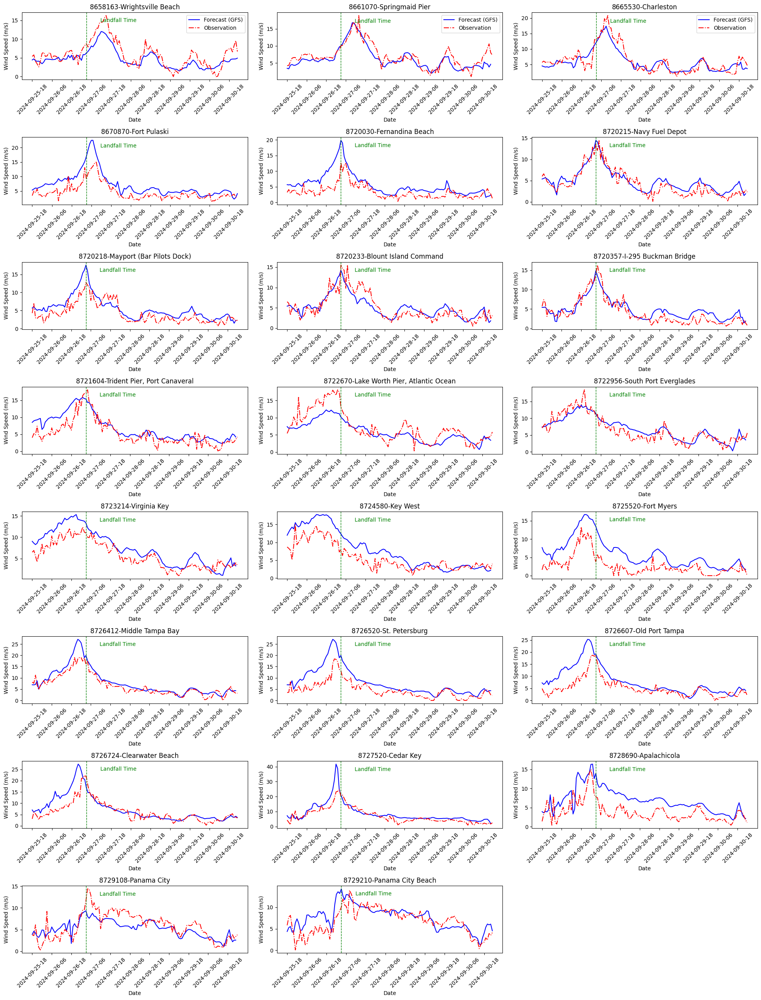

In [201]:

def convert_to_datetime(time_step):
    start_date = time_df['Time'][0]
    time_delta = timedelta(hours=1)  
    return start_date + time_step * time_delta


# Define the number of rows and columns for subplots
num_rows = 8
num_cols = 3


# Create a figure and axes array with subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 26))



index = 0
for row in range(num_rows):
    for col in range(num_cols):
        if index >= len(filtered_wind_stations['nos_id']):
            axs[row, col].axis('off')
            break
            
        
        nos_id = filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]
        ax = axs[row, col]
        
        ax.plot(np.sqrt(u_wind_dfs_forecast[int(nos_id)]**2 + v_wind_dfs_forecast[int(nos_id)]**2)[:len(Wind_Observation_2d_forecast[0])], label='Forecast (GFS)', color='blue')
        ax.plot(Wind_Observation_2d_forecast[index].values, label='Observation', color='red',linestyle='dashdot')


        ax.set_title(f'{filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]}-{filtered_wind_stations['name'][filtered_wind_stations.index[index]]}')
        ax.set_xlabel('Date')

        # Set x ticks and labels
        ax.set_xticks(range(0, len(Wind_Observation_2d_forecast[0]), 12)) 
        time_steps = range(0, len(Wind_Observation_2d_forecast[0]))
        time_labels = [convert_to_datetime(step) for step in time_steps]

        # Calculate the landfall time step
        start_date = datetime.strptime(date_range[0], '%Y%m%d')
        landfall_datetime = start_date + timedelta(hours=landfall_time_step)
 
        forecast_2d_landfall_time_step = None 
    
        for step, time_label in zip(time_steps, time_labels): 

            if time_label == landfall_datetime:
                 forecast_2d_landfall_time_step = step 
                 break   
        

        selected_dates = time_labels[::12]
        ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
        
        ax.axvline(x=forecast_2d_landfall_time_step, color='green', linestyle='--', linewidth=1)
        ax.text(landfall_time_step*0.7, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
        
        ax.set_ylabel('Wind Speed (m/s)')
        if row == 0:
           ax.legend(loc='upper right')
        
        index += 1


# Adjust layout
plt.tight_layout()


# Save the figure
plt.savefig('GFS_Wind_Forecasting.png')


# Display the plot
plt.show()





# Read STOFS-3D-Atl input wind data for nowcast

In [193]:
def read_netcdf_from_s3(bucket_name, key):
    """
    Function to read a NetCDF file from an S3 bucket using thalassa API.
    
    Parameters:
    - bucket_name: Name of the S3 bucket
    - key: Key/path to the NetCDF file in the bucket
    
    Returns:
    - ds: xarray Dataset containing the NetCDF data
    """
    s3 = s3fs.S3FileSystem(anon=True)
    url = f"s3://{bucket_name}/{key}"
    ds = xr.open_dataset(s3.open(url, 'rb'), drop_variables=['nvel'])
    return ds


In [194]:

date = date_range[0]

base_key = f'stofs_3d_atl.{date}'

filename = f'schout_adcirc_{date}.nc'
         
key = f'STOFS-3D-Atl/{base_key}/{filename}'

bucket_name = bucket_name_3d

dataset = read_netcdf_from_s3(bucket_name, key)  # the first 24 hr (240 time steps are the now cast data)


def  get_indices_of_nearest_nodes(ds: xr.Dataset, x: float, y: float, num_nodes: int ) -> List[int]:
    # https://www.unidata.ucar.edu/blogs/developer/en/entry/accessing_netcdf_data_by_coordinates
    # https://github.com/Unidata/python-workshop/blob/fall-2016/notebooks/netcdf-by-coordinates.ipynb
    dist = abs(ds.x - x) ** 2 + abs(ds.y - y) ** 2
    indices_of_nearest_nodes = dist.argsort()[:num_nodes]
    return indices_of_nearest_nodes.values

# Initialize an empty DataFrame to store the data
index = pd.DataFrame()

# Initialize an empty DataFrame to store the data
data = []

for nos_id, x, y in zip(filtered_wind_stations['nos_id'], filtered_wind_stations['lon'], filtered_wind_stations['lat']):
    index_values = get_indices_of_nearest_nodes(dataset, x, y,1)
    data.append({'nos_id': nos_id , 'index_value': index_values})

# Convert the list of dictionaries to a DataFrame
index = pd.DataFrame(data)
index_list = []

for i in range(0,len(index)):
  index_list.append(int(index.index_value[i][0]))



In [195]:

# Read STOFS-3d-Atlantic


bucket_name = bucket_name_3d
start_date = datetime.strptime(date_range[0], '%Y%m%d')
end_date = datetime.strptime(date_range[1], '%Y%m%d')
end_date += timedelta(days=1)  # to include all nowcast data for the specified range


dates = []
current_date = start_date
while current_date <= end_date:
    dates.append(current_date.strftime('%Y%m%d'))  # Format as YYYYMMDD
    current_date += timedelta(days=1)


wind_forecast_3d_all_list = []


for date in dates:
    print(date)
    base_key = f'stofs_3d_atl.{date}'
    previous_date = datetime.strptime(date, '%Y%m%d') - timedelta(days=1)
    filename = f'schout_adcirc_{previous_date.strftime("%Y%m%d")}.nc'
    key = f'STOFS-3D-Atl/{base_key}/{filename}'
    
    try:
        forecast_3d = read_netcdf_from_s3(bucket_name, key)
        
        # Calculate square root of sum of squares for uwind and vwind at specific points (nos_id)
        sqrt_uv_sum = np.sqrt(forecast_3d['uwind'][:, index_list]**2 + forecast_3d['vwind'][:, index_list]**2)
        
        # Store the result in a list
        wind_forecast_3d_all_list.append(sqrt_uv_sum)
        
    except Exception as e:
        print(f'Error reading file {key} from S3: {str(e)}')


# Concatenate all datasets along the time dimension
if wind_forecast_3d_all_list:
    wind_concat = xr.concat(wind_forecast_3d_all_list, dim='time')
else:
    print("No valid data found.")


wind_concat


20240924
20240925
20240926
20240927
20240928
20240929


<xarray.DataArray (time: 144, node: 23)> Size: 26kB
array([[4.15342972, 5.17167432, 0.55291973, ..., 2.29381624, 1.24137716,
        2.13808209],
       [4.35768503, 4.5678308 , 1.34802785, ..., 2.77205607, 1.18317415,
        2.20206224],
       [4.71518547, 3.82050646, 1.04122922, ..., 2.93038908, 0.1434353 ,
        1.47094892],
       ...,
       [1.79567637, 1.31568596, 3.71363911, ..., 3.94762975, 3.32872988,
        5.27713276],
       [1.05828728, 2.75657747, 4.68545363, ..., 1.85288887, 2.6813982 ,
        4.47319269],
       [1.25974544, 2.4020039 , 4.01131823, ..., 3.38417787, 2.55851105,
        4.50648484]])
Coordinates:
  * time     (time) datetime64[ns] 1kB 2024-09-23T13:00:00 ... 2024-09-29T12:...
    x        (node) float64 184B -77.79 -78.92 -79.92 ... -84.98 -85.66 -85.88
    y        (node) float64 184B 34.22 33.66 32.78 32.03 ... 29.72 30.15 30.22
Dimensions without coordinates: node

# Read Wind_observation_data for STOFS-3D-Atl

In [196]:
# Initialize an empty DataFrame to store the data
Wind_Observation_3d_nowcast= []

# Loop over each nos_id
for nos_id in filtered_wind_stations['nos_id']:
   
       # Retrieve wind information for the specified date range
       station_wind = fetch_coops_station(
       station_id=nos_id,
       start_date=wind_concat['time'].values[0],
       end_date=wind_concat['time'].values[-1],
       product='wind',  interval='h')
      

       # Add the data for the current station to the result DataFrame
       #station_wind = station_wind.reset_index()
       Wind_Observation_3d_nowcast.append(station_wind['speed'])
Wind_Observation_3d_nowcast

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time

/lustre/en

[time
 2024-09-23 13:00:00+00:00    4.2
 2024-09-23 14:00:00+00:00    5.0
 2024-09-23 15:00:00+00:00    5.7
 2024-09-23 16:00:00+00:00    5.3
 2024-09-23 17:00:00+00:00    3.8
                             ... 
 2024-09-29 08:00:00+00:00    0.9
 2024-09-29 09:00:00+00:00    0.0
 2024-09-29 10:00:00+00:00    1.6
 2024-09-29 11:00:00+00:00    1.4
 2024-09-29 12:00:00+00:00    0.9
 Name: speed, Length: 144, dtype: float64,
 time
 2024-09-23 13:00:00+00:00    6.3
 2024-09-23 14:00:00+00:00    5.9
 2024-09-23 15:00:00+00:00    5.2
 2024-09-23 16:00:00+00:00    4.6
 2024-09-23 17:00:00+00:00    4.8
                             ... 
 2024-09-29 08:00:00+00:00    2.7
 2024-09-29 09:00:00+00:00    1.8
 2024-09-29 10:00:00+00:00    1.4
 2024-09-29 11:00:00+00:00    2.9
 2024-09-29 12:00:00+00:00    3.1
 Name: speed, Length: 144, dtype: float64,
 time
 2024-09-23 13:00:00+00:00    1.5
 2024-09-23 14:00:00+00:00    2.1
 2024-09-23 15:00:00+00:00    1.5
 2024-09-23 16:00:00+00:00    3.8
 2024-09-23 

# Plot Wind nowcast data for STOFS-3D-Atl

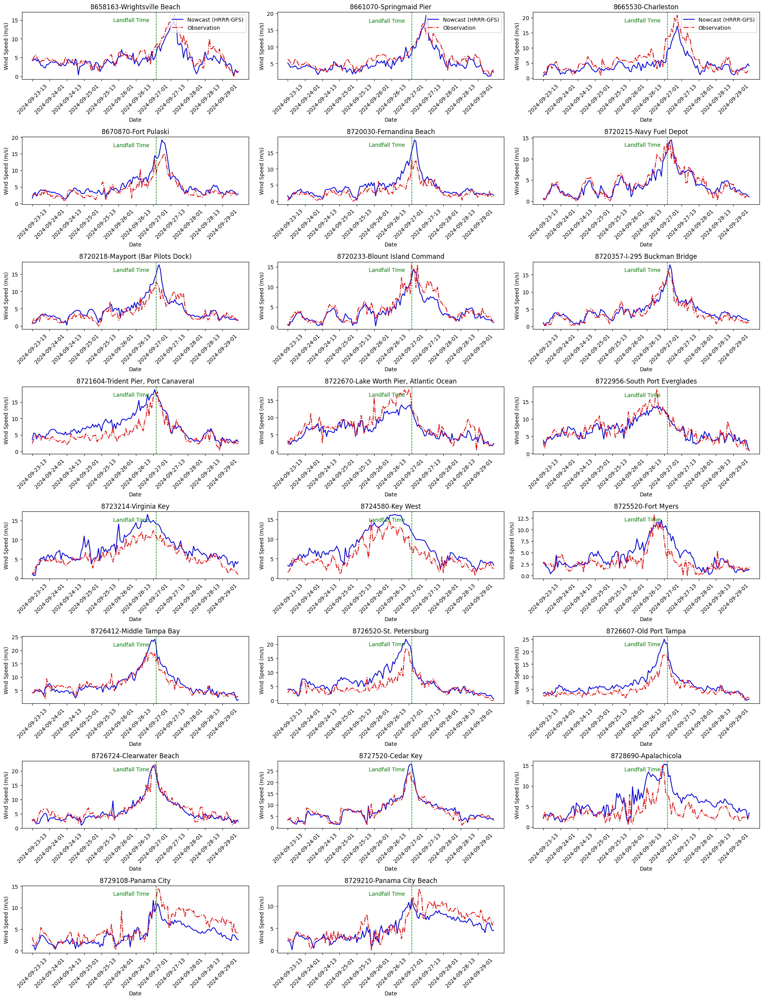

In [197]:

def convert_to_datetime(time_step):
    start_date = datetime.fromtimestamp(wind_concat['time'].values[0].astype(int) * 1e-9, tz=timezone.utc)
    time_delta = timedelta(hours=1)  
    return start_date + time_step * time_delta


# Define the number of rows and columns for subplots
num_rows = 8
num_cols = 3


# Create a figure and axes array with subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 26))



index = 0
for row in range(num_rows):
    for col in range(num_cols):
        if index >= len(filtered_wind_stations['nos_id']):
            axs[row, col].axis('off')
            break
        
        nos_id = filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]
        ax = axs[row, col]
        
        ax.plot(wind_concat[:,index], label='Nowcast (HRRR-GFS)', color='blue')
        ax.plot(Wind_Observation_3d_nowcast[index].values, label='Observation', color='red',linestyle='dashdot')


        ax.set_title(f'{filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]}-{filtered_wind_stations['name'][filtered_wind_stations.index[index]]}')
        ax.set_xlabel('Date')

        # Set x ticks and labels
        ax.set_xticks(range(0, len(Wind_Observation_3d_nowcast[0]), 12)) 
        time_steps = range(0, len(Wind_Observation_3d_nowcast[0]))
        time_labels = [convert_to_datetime(step) for step in time_steps]
        
        # Calculate the landfall time step
        start_date = datetime.strptime(date_range[0], '%Y%m%d')
        landfall_datetime = start_date + timedelta(hours=landfall_time_step)
 
        nowcast_3d_landfall_time_step = None 

        for step, time_label in zip(time_steps, time_labels): 

            if time_label.replace(tzinfo = None) == landfall_datetime:
               nowcast_3d_landfall_time_step = step 
               break 

        selected_dates = time_labels[::12]
        ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
        ax.axvline(x=nowcast_3d_landfall_time_step, color='green', linestyle='--', linewidth=1)
        ax.text(nowcast_3d_landfall_time_step*0.8, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
        
        ax.set_ylabel('Wind Speed (m/s)')
        if row == 0:
           ax.legend(loc='upper right')
        
        index += 1


# Adjust layout
plt.tight_layout()


# Save the figure
plt.savefig('STOFS_3D_Wind_Nowcast.png')

# Display the plot
plt.show()




# Read wind Forecast from STOFS-3D-Atl

In [198]:
# Read STOFS-3d-Atlantic


bucket_name = bucket_name_3d
start_date = datetime.strptime(date_range[0], '%Y%m%d')
end_date = start_date + timedelta(days=5) # Forecast data provided in each STOFS-3D-Atl cycle


# Find the forecast date

dates = []

forecast_date = (start_date + timedelta(hours=landfall_time_step-Hours_before_landfall)).strftime('%Y%m%d')

current_date = datetime.strptime(forecast_date, '%Y%m%d')-timedelta(days=1) #starting from nowcast data
while current_date <= end_date:
    dates.append(current_date.strftime('%Y%m%d'))  # Format as YYYYMMDD
    current_date += timedelta(days=1)


wind_forecast_3d_all_list = []

for date in dates:
    print(date)
    base_key = f'stofs_3d_atl.{forecast_date}'
    filename = f'schout_adcirc_{date}.nc'
    key = f'STOFS-3D-Atl/{base_key}/{filename}'
    
    try:
        wind_forecast_3d = read_netcdf_from_s3(bucket_name, key)
        
        # Calculate square root of sum of squares for uwind and vwind at specific points (nos_id)
        sqrt_uv_sum = np.sqrt(wind_forecast_3d['uwind'][:, index_list]**2 + wind_forecast_3d['vwind'][:, index_list]**2)
        
        # Store the result in a list
        wind_forecast_3d_all_list.append(sqrt_uv_sum)
        
    except Exception as e:
        print(f'Error reading file {key} from S3: {str(e)}')


# Concatenate all datasets along the time dimension
if wind_forecast_3d_all_list:
    wind_concat_forecast = xr.concat(wind_forecast_3d_all_list, dim='time')
else:
    print("No valid data found.")


wind_concat_forecast


20240925
20240926
20240927
20240928
20240929


<xarray.DataArray (time: 120, node: 23)> Size: 22kB
array([[2.07164585, 2.64979077, 2.77104123, ..., 4.07064397, 1.53473915,
        1.77881196],
       [2.50233318, 3.05506727, 2.72790235, ..., 4.24127591, 1.13321329,
        2.91833021],
       [3.42855863, 3.36910292, 3.93226974, ..., 4.38766886, 3.36755928,
        2.57502728],
       ...,
       [2.46081327, 3.28349078, 2.00386609, ..., 2.76936769, 2.94397014,
        3.19512376],
       [2.42454666, 2.8002236 , 1.85231039, ..., 2.47476133, 2.73136841,
        2.93194931],
       [2.35369741, 2.37642273, 2.10572091, ..., 2.24509209, 2.43348259,
        2.63801748]])
Coordinates:
  * time     (time) datetime64[ns] 960B 2024-09-25T13:00:00 ... 2024-09-30T12...
    x        (node) float64 184B -77.79 -78.92 -79.92 ... -84.98 -85.66 -85.88
    y        (node) float64 184B 34.22 33.66 32.78 32.03 ... 29.72 30.15 30.22
Dimensions without coordinates: node

# Read Observation data for forecast wind

In [199]:
# Initialize an empty DataFrame to store the data
Wind_Observation_3d_forecast= []

# Loop over each nos_id
for nos_id in filtered_wind_stations['nos_id']:
       print(nos_id)
       # Retrieve wind information for the specified date range
       station_wind = fetch_coops_station(
       station_id=nos_id,
       start_date=wind_concat_forecast['time'].values[0],
       end_date=wind_concat_forecast['time'].values[-1],
       product='wind',  interval='h')
      

       # Add the data for the current station to the result DataFrame
       #station_wind = station_wind.reset_index()
       Wind_Observation_3d_forecast.append(station_wind['speed'])
Wind_Observation_3d_forecast

8658163


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8661070


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8665530


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8670870


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8720030


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8720215


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8720218


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8720233


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8720357


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8721604


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8722670


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8722956


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8723214


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8724580


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8725520


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8726412


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8726520


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8726607


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8726724


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8727520


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8728690


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8729108


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



8729210


/lustre/env/miniconda3/envs/STOFS-Observer/lib/python3.12/site-packages/searvey/_common.py:33: UserWarning:

Assuming UTC!
Data is retrieved and stored in UTC time



[time
 2024-09-25 13:00:00+00:00    2.4
 2024-09-25 14:00:00+00:00    2.7
 2024-09-25 15:00:00+00:00    4.1
 2024-09-25 16:00:00+00:00    4.5
 2024-09-25 17:00:00+00:00    3.9
                             ... 
 2024-09-30 08:00:00+00:00    1.8
 2024-09-30 09:00:00+00:00    0.7
 2024-09-30 10:00:00+00:00    1.3
 2024-09-30 11:00:00+00:00    0.0
 2024-09-30 12:00:00+00:00    0.1
 Name: speed, Length: 120, dtype: float64,
 time
 2024-09-25 13:00:00+00:00    4.3
 2024-09-25 14:00:00+00:00    3.0
 2024-09-25 15:00:00+00:00    2.4
 2024-09-25 16:00:00+00:00    4.3
 2024-09-25 17:00:00+00:00    4.2
                             ... 
 2024-09-30 08:00:00+00:00    3.8
 2024-09-30 09:00:00+00:00    3.1
 2024-09-30 10:00:00+00:00    2.3
 2024-09-30 11:00:00+00:00    1.0
 2024-09-30 12:00:00+00:00    3.0
 Name: speed, Length: 120, dtype: float64,
 time
 2024-09-25 13:00:00+00:00    4.3
 2024-09-25 14:00:00+00:00    5.8
 2024-09-25 15:00:00+00:00    6.1
 2024-09-25 16:00:00+00:00    6.9
 2024-09-25 

# Plot wind forecast for STOFS-3D-Atl

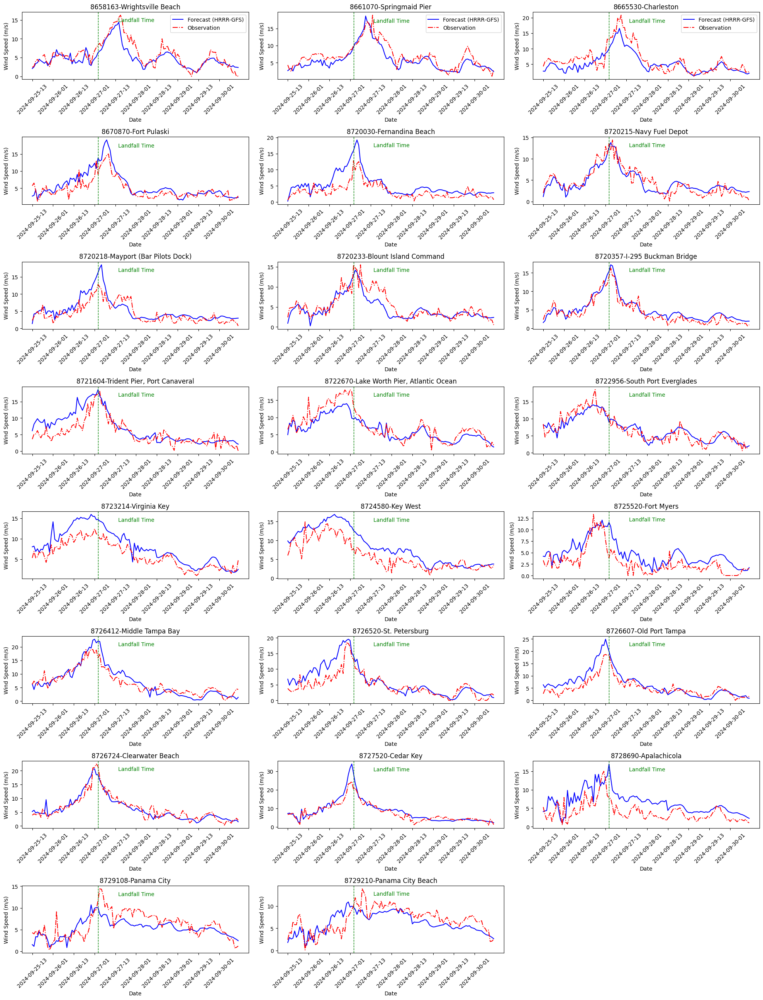

In [200]:
def convert_to_datetime(time_step):
    start_date = datetime.fromtimestamp(wind_concat_forecast['time'].values[0].astype(int) * 1e-9, tz=timezone.utc)
    time_delta = timedelta(hours=1)  
    return start_date + time_step * time_delta


# Define the number of rows and columns for subplots
num_rows = 8
num_cols = 3


# Create a figure and axes array with subplots
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 26))



index = 0
for row in range(num_rows):
    for col in range(num_cols):
        if index >= len(filtered_wind_stations['nos_id']):
            axs[row, col].axis('off')
            break
        
        nos_id = filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]
        ax = axs[row, col]
        
        ax.plot(wind_concat_forecast[:len(Wind_Observation_3d_forecast[0]),index], label='Forecast (HRRR-GFS)', color='blue')
        ax.plot(Wind_Observation_3d_forecast[index].values, label='Observation', color='red',linestyle='dashdot')


        ax.set_title(f'{filtered_wind_stations['nos_id'][filtered_wind_stations.index[index]]}-{filtered_wind_stations['name'][filtered_wind_stations.index[index]]}')
        ax.set_xlabel('Date')

        # Set x ticks and labels
        ax.set_xticks(range(0, len(Wind_Observation_3d_forecast[0]), 12)) 
        time_steps = range(0, len(Wind_Observation_3d_forecast[0]))
        time_labels = [convert_to_datetime(step) for step in time_steps]
        
        # Calculate the landfall time step
        start_date = datetime.strptime(date_range[0], '%Y%m%d')
        landfall_datetime = start_date + timedelta(hours=landfall_time_step)
 
        forecast_3d_landfall_time_step = None 

        for step, time_label in zip(time_steps, time_labels): 

            if time_label.replace(tzinfo = None) == landfall_datetime:
               forecast_3d_landfall_time_step = step 
               break 

        selected_dates = time_labels[::12]
        ax.set_xticklabels([date.strftime('%Y-%m-%d-%H') for date in selected_dates], rotation=45)
        ax.axvline(x=forecast_3d_landfall_time_step, color='green', linestyle='--', linewidth=1)
        ax.text(landfall_time_step*0.8, ax.get_ylim()[1]*0.85, 'Landfall Time', color='green', ha='center')
        
        ax.set_ylabel('Wind Speed (m/s)')
        if row == 0:
           ax.legend(loc='upper right')
        
        index += 1


# Adjust layout
plt.tight_layout()


# Save the figure
plt.savefig('STOFS_3D_Wind_forecast.png')

# Display the plot
plt.show()
